# Análisis de Fracturas Óseas mediante Aprendizaje No Supervisado

## Introducción al Problema

En el campo de la radiología médica, la detección y clasificación de fracturas óseas es una tarea crítica que requiere precisión y rapidez. Este proyecto aplica técnicas de **aprendizaje no supervisado** para analizar imágenes médicas de rayos X y clasificar automáticamente si una imagen contiene fracturas o representa huesos saludables y en caso de presentar fracturas que tipo de fractura es.

## [Dataset: Human Bone Fractures Multi-modal Image Dataset (HBFMID)](https://www.kaggle.com/datasets/pkdarabi/bone-fracture-detection-computer-vision-project)

### Descripción General
El dataset utilizado es el **Human Bone Fractures Multi-modal Image Dataset (HBFMID)**, una colección especializada de imágenes radiográficas diseñada específicamente para la detección y clasificación de fracturas óseas.

### Estructura del Dataset
El dataset está organizado con la siguiente estructura de directorios:

```
Human Bone Fractures Multi-modal Image Dataset (HBFMID)/
└── Bone Fractures Detection/
    ├── train/          # Conjunto de entrenamiento
    │   ├── images/     # Imágenes radiográficas (.jpg)
    │   └── labels/     # Etiquetas en formato YOLO (.txt)
    ├── test/           # Conjunto de prueba
    │   ├── images/     # Imágenes radiográficas (.jpg)
    │   └── labels/     # Etiquetas en formato YOLO (.txt)
    └── valid/          # Conjunto de validación
        ├── images/     # Imágenes radiográficas (.jpg)
        └── labels/     # Etiquetas en formato YOLO (.txt)
```

### División de Datos
- **Training Set (train/)**: Conjunto principal para entrenar modelos, contiene la mayoría de las muestras
- **Test Set (test/)**: Conjunto para evaluación final del modelo, separado completamente del entrenamiento
- **Validation Set (valid/)**: Conjunto para validación durante el entrenamiento y ajuste de hiperparámetros

### Formato de Etiquetas YOLO

Las etiquetas están almacenadas en **formato YOLO (You Only Look Once)**, un estándar ampliamente utilizado en detección de objetos. Cada archivo `.txt` corresponde a una imagen `.jpg` del mismo nombre y contiene las anotaciones de los objetos detectados.

#### Estructura del Formato YOLO
Cada línea en un archivo de etiquetas representa un objeto detectado con el siguiente formato:

```
<class_id> <x_center> <y_center> <width> <height>
```

Donde:
- **`class_id`**: Identificador numérico de la clase del objeto
- **`x_center`**: Coordenada X del centro del objeto (normalizada 0-1)
- **`y_center`**: Coordenada Y del centro del objeto (normalizada 0-1)  
- **`width`**: Ancho del objeto (normalizado 0-1)
- **`height`**: Alto del objeto (normalizado 0-1)

#### Clases del Dataset

Según el análisis del dataset, las clases identificadas incluyen:
- **Clase 0**: Comminuted
- **Clase 1**: Greenstick
- **Clase 2**: Healthy (Hueso saludable)
- **Clase 3**: Linear
- **Clase 4**: Oblique Displaced
- **Clase 5**: Oblique
- **Clase 6**: Segmental
- **Clase 7**: Spiral
- **Clase 8**: Transverse Displaced

En resúmen solo una de las clases es un hueso saludable, las demás son un tipo de fractura.

### Ejemplo de Archivo de Etiquetas
```
# Archivo: imagen_001.txt
2 0.5984375 0.84765625 0.2953125 0.18515625
```
Este ejemplo indica:
- Clase 2 (Hueso saludable)
- Centro del objeto en (59.8%, 84.8%) de la imagen
- Dimensiones del objeto: 29.5% de ancho × 18.5% de alto

### Desafíos del Dataset

1. **Desbalance de Clases**: Existe una distribución desigual entre fracturas y huesos saludables
2. **Variabilidad Anatómica**: Diferentes tipos de huesos y ángulos de captura
3. **Calidad de Imagen**: Variaciones en contraste, iluminación y resolución
4. **Complejidad Médica**: Fracturas sutiles que requieren expertise radiológico
5. **Formato de las etiquetas:** Ya qe las etiquetas estan en formato YOLO, requieren un tratamiento especial para extraer la información que nos interesa y cuidar de mantener el orden entre las etiquetas y los datos.
6. **Falta de datos**: El conjunto de entrenamiento cuenta con poco más de $1300$ fotografías lo cual puede no ser suficiente, para mejorar el desempeño podemos aplicar técnicas de sobremuestreo.

### Objetivo del Análisis

El objetivo principal es aplicar técnicas de **clustering no supervisado** para:
1. Agrupar automáticamente las imágenes según similitudes visuales
2. Identificar patrones latentes en las imágenes radiográficas
3. Evaluar la capacidad del modelo para distinguir entre fracturas y huesos saludables
4. Crear una matriz de confusión para medir el rendimiento del clustering

Este enfoque no supervisado es particularmente valioso cuando:
- No se dispone de etiquetas suficientes para entrenamiento supervisado
- Se busca descubrir patrones ocultos en los datos médicos
- Una primera aproximación al problema

# Visualización de los datos

Antes que nada vamos a visualizar como es que se ven las imagenes del dataset, aprovechando que la etiqueta YOLO contiene la ubicación exacta de la fractura se puede crear un recuadro que facilite la comprensión.

VISUALIZACIÓN DE MUESTRAS DEL DATASET - TRAIN


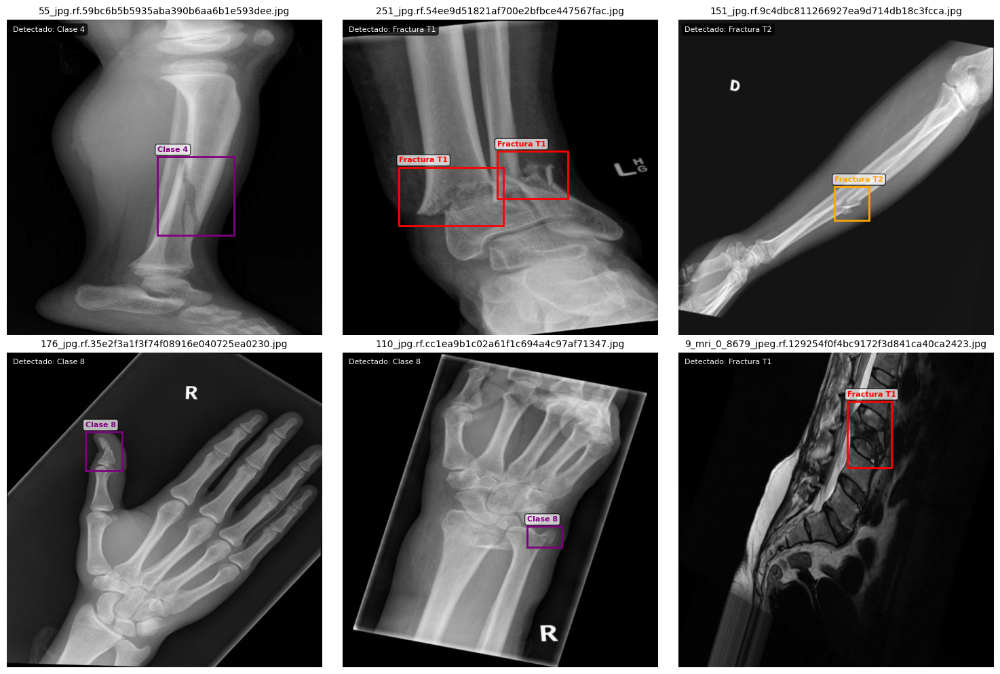

<Figure size 640x480 with 0 Axes>

In [1]:
# Visualización de ejemplos del dataset con anotaciones YOLO
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import numpy as np
import random
import os
import glob

# Ruta base del dataset
BASE_PATH = '/home/albertoa/Documentos/__DS_ML__/data/Human Bone Fractures Multi-modal Image Dataset (HBFMID)/Bone Fractures Detection'

def visualize_dataset_samples(subset='train', num_samples=6):
    """
    Visualiza muestras del dataset y agrega sus anotaciones YOLO superpuestas
    """
    print("="*70)
    print(f"VISUALIZACIÓN DE MUESTRAS DEL DATASET - {subset.upper()}")
    print("="*70)
    
    images_path = os.path.join(BASE_PATH, subset, 'images')
    labels_path = os.path.join(BASE_PATH, subset, 'labels')
    
    
    # Obtener lista de imágenes
    jpg_files = glob.glob(os.path.join(images_path, '*.jpg'))
    
    
    # Seleccionar muestras aleatorias
    selected_files = random.sample(jpg_files, num_samples)
    
    # Configurar la visualización
    cols = 3
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5*rows))
    
    if rows == 1:
        axes = [axes] if num_samples == 1 else axes
    else:
        axes = axes.flatten()
    
    # Mapeo de colores para diferentes clases
    class_colors = {
        0: 'red',      # Fractura Tipo 1
        1: 'orange',   # Fractura Tipo 2  
        2: 'green',    # Hueso Saludable
        3: 'blue'      # Fractura Tipo 3
    }
    
    class_names = {
        0: "Fractura T1",
        1: "Fractura T2", 
        2: "Saludable",
        3: "Fractura T3"
    }
    
    for idx, img_file in enumerate(selected_files):
        # Cargar imagen
        img = cv2.imread(img_file)
        if img is None:
            continue
            
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        height, width = img_rgb.shape[:2]
        
        # Cargar etiquetas correspondientes
        base_name = os.path.splitext(os.path.basename(img_file))[0]
        label_file = os.path.join(labels_path, f"{base_name}.txt")
        
        ax = axes[idx]
        ax.imshow(img_rgb)
        ax.set_title(f"{base_name}.jpg", fontsize=10)
        ax.axis('off')
        
        # Dibujar anotaciones YOLO si existen
        if os.path.exists(label_file):
            try:
                with open(label_file, 'r') as f:
                    lines = f.readlines()
                
                annotations_text = []
                
                for line in lines:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        class_id = int(parts[0])
                        x_center = float(parts[1])
                        y_center = float(parts[2])
                        box_width = float(parts[3])
                        box_height = float(parts[4])
                        
                        # Convertir coordenadas YOLO a píxeles
                        x_center_px = x_center * width
                        y_center_px = y_center * height
                        box_width_px = box_width * width
                        box_height_px = box_height * height
                        
                        # Calcular esquina superior izquierda
                        x_left = x_center_px - box_width_px / 2
                        y_top = y_center_px - box_height_px / 2
                        
                        # Dibujar rectángulo
                        color = class_colors.get(class_id, 'purple')
                        rect = patches.Rectangle(
                            (x_left, y_top), 
                            box_width_px, 
                            box_height_px,
                            linewidth=2, 
                            edgecolor=color, 
                            facecolor='none'
                        )
                        ax.add_patch(rect)
                        
                        # Agregar etiqueta de clase
                        class_name = class_names.get(class_id, f"Clase {class_id}")
                        annotations_text.append(f"{class_name}")
                        
                        # Texto en la imagen
                        ax.text(
                            x_left, 
                            y_top - 10, 
                            class_name,
                            color=color, 
                            fontsize=8, 
                            fontweight='bold',
                            bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.7)
                        )
                
                # Mostrar resumen de anotaciones
                if annotations_text:
                    summary = ", ".join(set(annotations_text))
                    ax.text(
                        0.02, 0.98, 
                        f"Detectado: {summary}",
                        transform=ax.transAxes,
                        fontsize=8,
                        verticalalignment='top',
                        bbox=dict(boxstyle="round,pad=0.3", facecolor='black', alpha=0.7),
                        color='white'
                    )
                
            except Exception as e:
                ax.text(
                    0.02, 0.98, 
                    f"Error: {str(e)[:30]}...",
                    transform=ax.transAxes,
                    fontsize=8,
                    color='red'
                )
        else:
            ax.text(
                0.02, 0.98, 
                "Sin etiquetas",
                transform=ax.transAxes,
                fontsize=8,
                color='orange'
            )
    
    # Ocultar axes vacíos
    for idx in range(num_samples, len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

# Visualizar muestras
visualize_dataset_samples(subset='train', num_samples=6)
plt.savefig(os.path.join(BASE_PATH, 'visualizacion_muestras.png'))

# Carga y preprocesamiento de imágenes

La siguiente función carga imágenes JPG del dataset de fracturas óseas y las preprocesa:
- Conversión a escala de grises (elimina información de color no relevante para este análisis)
- Redimensionamiento a 64×64 píxeles (para tener un tamaño uniforme)
- Normalización de valores entre 0 y 1 (para mejorar el rendimiento de los algoritmos)
- Aplanamiento de las imágenes en vectores unidimensionales 
- Divide entrenamiento, prueba y validación
- Extrae el tipo de fractura del formato YOLO y las almacena en `y`, haciendo la distincion de entrenamiento, prueba y validación

In [2]:
import os
import glob
import re
import numpy as np
import matplotlib.pyplot as plt
import cv2   # Procesamiento de imágenes, carga, covierte a escala de grises, redimensiona
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import glob  # Para localizar las imágenes jpg
from tqdm.notebook import tqdm  # Muestra una barra de progreso en bucles

# Ruta base del dataset
BASE_PATH = '/home/albertoa/Documentos/__DS_ML__/data/Human Bone Fractures Multi-modal Image Dataset (HBFMID)/Bone Fractures Detection'


def natural_sort_key(s):
    """Convierte números dentro de strings a enteros para ordenar naturalmente."""
    return [int(t) if t.isdigit() else t.lower() for t in re.split(r'(\d+)', s)]

def load_data(BASE_PATH, subset='train', target_size=(64, 64)):
    """
    Carga etiquetas y sus imágenes correspondientes.
    Ignora archivos vacíos y devuelve solo pares válidos.
    
    Returns:
        X: np.array con imágenes preprocesadas
        y: lista con etiquetas
        files: lista de nombres de archivos válidos
    """
    labels_path = os.path.join(BASE_PATH, subset, 'labels')
    images_path = os.path.join(BASE_PATH, subset, 'images')

    # Archivos de etiquetas ordenados naturalmente
    txt_files = sorted(glob.glob(os.path.join(labels_path, '*.txt')), key=natural_sort_key)

    X, y, files = [], [], []

    for idx, txt_file in enumerate(txt_files):
        with open(txt_file, 'r') as f:
            lines = f.readlines()

        if not lines:  # archivo vacío
            print(f"Archivo vacío en posición {idx}: {os.path.basename(txt_file)}")
            continue

        # Extraer etiqueta (primer valor de la primera línea)
        parts = lines[0].strip().split()
        if len(parts) < 5:
            continue
        class_id = int(parts[0])

        # Buscar imagen correspondiente
        img_file = os.path.join(images_path, os.path.basename(txt_file).replace('.txt', '.jpg'))
        img = cv2.imread(img_file)
        if img is None:
            print(f"Error al cargar la imagen: {img_file}")
            continue

        # Preprocesar imagen
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        resized = cv2.resize(gray, target_size)
        normalized = resized / 255.0
        flattened = normalized.flatten()

        # Guardar resultados
        X.append(flattened)
        y.append(class_id)
        files.append(os.path.basename(img_file))

    if not X:
        raise ValueError("No se pudieron procesar datos válidos")

    X = np.array(X)
    y = np.array(y)
    print(f"Forma final de X: {X.shape}, etiquetas: {len(y)}")
    return X, y

X_train, y_train = load_data(BASE_PATH, subset='train', target_size=(64, 64))
X_test, y_test = load_data(BASE_PATH, subset='test', target_size=(64, 64))
X_valid, y_valid = load_data(BASE_PATH, subset='valid', target_size=(64, 64))

Archivo vacío en posición 777: 114_jpg.rf.8fb68ebceb36b9a54b444df085eee45b.txt
Archivo vacío en posición 778: 114_jpg.rf.9cc2885ecffd2ec5163828c485f30956.txt
Archivo vacío en posición 779: 114_jpg.rf.d9ca08ff087f9fd2f14d8c1403e16f19.txt
Forma final de X: (1344, 4096), etiquetas: 1344
Forma final de X: (64, 4096), etiquetas: 64
Forma final de X: (128, 4096), etiquetas: 128
Forma final de X: (1344, 4096), etiquetas: 1344
Forma final de X: (64, 4096), etiquetas: 64
Forma final de X: (128, 4096), etiquetas: 128


# Análisis de Componentes Principales (PCA)

El Análisis de Componentes Principales (PCA) es una técnica de reducción de dimensionalidad que nos permite transformar un conjunto de datos de alta dimensión en un conjunto de menor dimensión, conservando la mayor parte de la información original.

En nuestro caso, después de preprocesar las imágenes, obtenemos vectores de características de alta dimensión (64x64 = 4096 valores por imagen). Aplicaremos PCA para:

1. **Reducir la dimensionalidad**: Proyectar nuestros datos en un espacio de menor dimensión.
2. **Preservar la varianza**: Encontrar las direcciones (componentes) que maximizan la varianza.
3. **Eliminar ruido**: Los componentes menos significativos suelen corresponder al ruido en los datos.
4. **Visualización**: Facilitar la visualización de los datos.

A continuación, implementamos una función para encontrar el número óptimo de componentes PCA, analizando la varianza explicada acumulada.

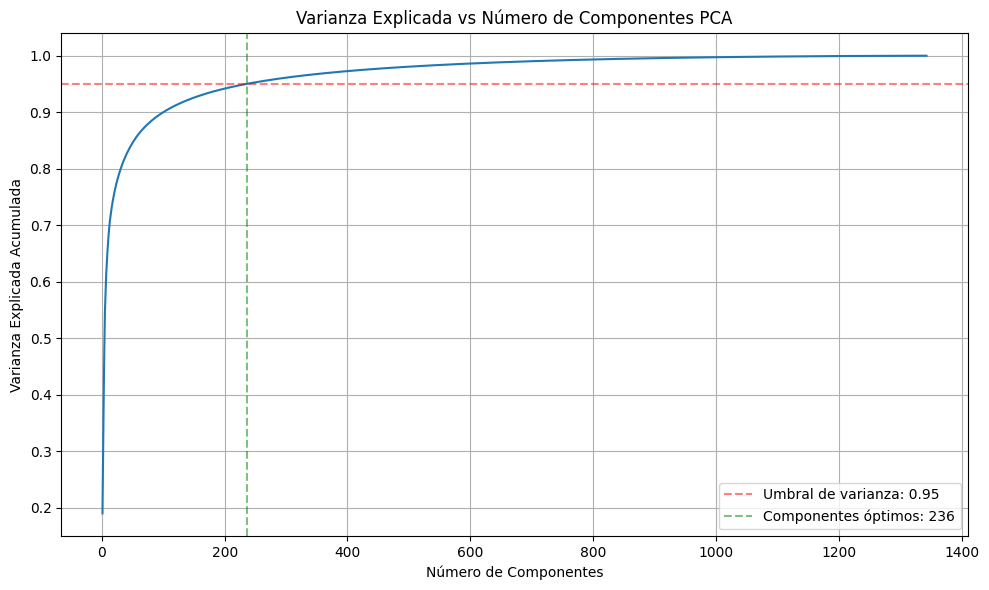

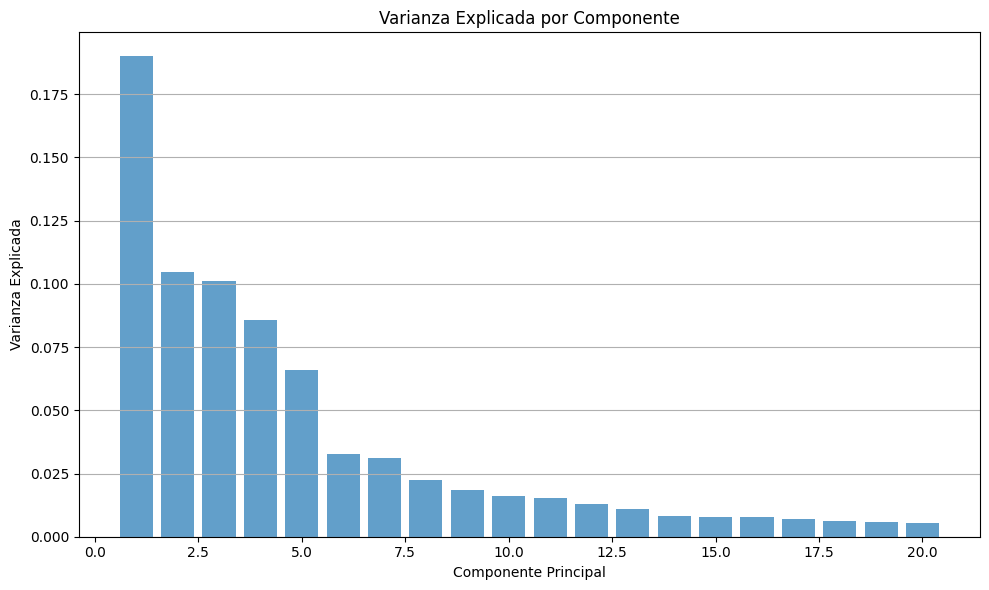

Componentes óptimos según el umbral de 0.95: 236
Varianza explicada con 236 componentes: 0.9502


np.int64(236)

In [3]:
def find_optimal_pca_components(data, variance_threshold=0.95, max_components=100):
    """
    Encuentra el número óptimo de componentes PCA que explican un umbral
    determinado de la varianza. Y grafica la varianza explicada.
    
    Args:
        data (numpy.ndarray): Datos de entrada para PCA
        variance_threshold (float): Umbral de varianza explicada deseado (0-1)
        max_components (int): Número máximo de componentes a considerar
        
    Returns:
        tuple: PCA ajustado, datos transformados y número de componentes óptimo
    """
    # Limitar el máximo de componentes al mínimo entre max_components y n_samples - 1
    n_samples = data.shape[0]
    max_components = min(max_components, n_samples - 1, data.shape[1])

    # Inicializar y ajustar PCA con todos los componentes posibles
    pca = PCA(n_components=max_components)
    pca.fit(data)
    
    # Calcular la varianza explicada acumulada
    explained_variance_ratio = pca.explained_variance_ratio_
    cumulative_variance = np.cumsum(explained_variance_ratio)
    
    # Encontrar el número mínimo de componentes para alcanzar el umbral
    n_components = np.argmax(cumulative_variance >= variance_threshold) + 1
    
    # Visualizar la varianza explicada
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, linestyle='-')
    plt.axhline(y=variance_threshold, color='r', linestyle='--', alpha=0.5, 
               label=f'Umbral de varianza: {variance_threshold}')
    plt.axvline(x=n_components, color='g', linestyle='--', alpha=0.5,
               label=f'Componentes óptimos: {n_components}')
    plt.xlabel('Número de Componentes')
    plt.ylabel('Varianza Explicada Acumulada')
    plt.title('Varianza Explicada vs Número de Componentes PCA')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()
    
    # También mostrar la varianza explicada por los primeros componentes
    plt.figure(figsize=(10, 6))
    plt.bar(range(1, min(20, len(explained_variance_ratio)) + 1), 
           explained_variance_ratio[:min(20, len(explained_variance_ratio))],
           alpha=0.7)
    plt.xlabel('Componente Principal')
    plt.ylabel('Varianza Explicada')
    plt.title('Varianza Explicada por Componente')
    plt.grid(True, axis='y')
    plt.tight_layout()
    plt.show()
    
    print(f"Componentes óptimos según el umbral de {variance_threshold}: {n_components}")
    print(f"Varianza explicada con {n_components} componentes: {cumulative_variance[n_components-1]:.4f}")
    
    # Crear un nuevo PCA con el número óptimo de componentes
    pca_optimal = PCA(n_components=n_components)
    transformed_data = pca_optimal.fit_transform(data)
    
    return pca_optimal, transformed_data, n_components


pca_model, X_train_pca, n_components = find_optimal_pca_components(
        X_train, variance_threshold=0.95, max_components=1344
    )  


X_valid_pca = pca_model.transform(X_valid)
X_test_pca = pca_model.transform(X_test)

pca_model.n_components_

Antes de continuar veamos la distribucion de las clases.

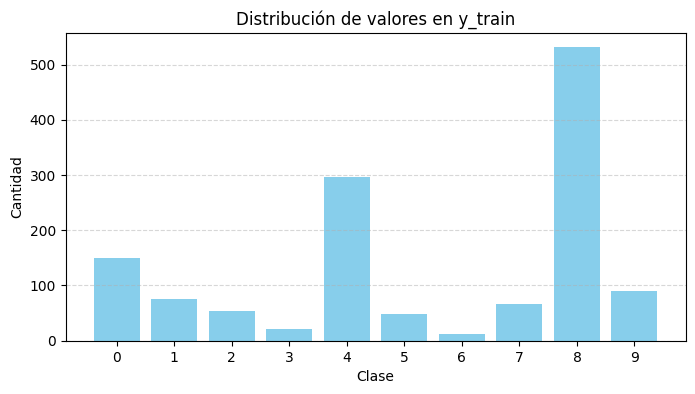

Clase 0: 150 muestras
Clase 1: 75 muestras
Clase 2: 54 muestras
Clase 3: 21 muestras
Clase 4: 297 muestras
Clase 5: 48 muestras
Clase 6: 12 muestras
Clase 7: 66 muestras
Clase 8: 531 muestras
Clase 9: 90 muestras


In [4]:
# Distribución de valores en y_train
unique, counts = np.unique(y_train, return_counts=True)
plt.figure(figsize=(8,4))
plt.bar(unique, counts, color='skyblue')
plt.xlabel('Clase')
plt.ylabel('Cantidad')
plt.title('Distribución de valores en y_train')
plt.xticks(unique)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()

for u, c in zip(unique, counts):
    print(f"Clase {u}: {c} muestras")

# Sobremuestreo

El sobremuestreo es una técnica utilizada para abordar el desbalance de clases en problemas de clasificación, especialmente cuando algunas clases (por ejemplo, fracturas raras o huesos saludables) están subrepresentadas en el conjunto de datos. En este proyecto, emplearemos **SMOTE (Synthetic Minority Over-sampling Technique)** para generar muestras sintéticas de las clases minoritarias y así equilibrar el conjunto de entrenamiento.

SMOTE funciona creando nuevas muestras interpolando entre ejemplos existentes de la clase minoritaria, lo que ayuda a los algoritmos de aprendizaje a no estar sesgados hacia las clases mayoritarias. Sin embargo, en el contexto de **imágenes médicas**, el sobremuestreo presenta desafíos adicionales:

- Las imágenes médicas contienen patrones complejos y sutiles que son críticos para el diagnóstico.
- La generación de muestras sintéticas puede introducir artefactos o distorsiones que no representan fielmente la realidad clínica.
- Es fundamental validar cuidadosamente que las muestras generadas no comprometan la calidad diagnóstica ni induzcan errores en el análisis.

A continuación, aplicaremos SMOTE sobre los vectores de características extraídos de las imágenes y compararemos el rendimiento del modelo antes y después del sobremuestreo, evaluando si realmente mejora la capacidad de agrupamiento y clasificación de fracturas óseas.

In [5]:
from imblearn.over_sampling import SMOTE
from collections import Counter

print("Distribución original:", Counter(y_train))

# SMOTE básico (todas las clases hacia la mayoría)
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_pca, y_train)

print("Distribución balanceada:", Counter(y_resampled))

Distribución original: Counter({np.int64(8): 531, np.int64(4): 297, np.int64(0): 150, np.int64(9): 90, np.int64(1): 75, np.int64(7): 66, np.int64(2): 54, np.int64(5): 48, np.int64(3): 21, np.int64(6): 12})
Distribución balanceada: Counter({np.int64(9): 531, np.int64(8): 531, np.int64(4): 531, np.int64(1): 531, np.int64(0): 531, np.int64(5): 531, np.int64(2): 531, np.int64(3): 531, np.int64(7): 531, np.int64(6): 531})


Listo, ya tenemos todas las clases con el mismo número de muestras.

# Clustering con K-means

Una vez que hemos reducido la dimensionalidad de nuestras imágenes mediante PCA, aplicaremos el algoritmo K-means para agrupar las imágenes en clusters según su similitud.

K-means es un algoritmo de agrupamiento que:

1. **Divide los datos en K clusters**: Asigna cada punto de datos al cluster cuyo centroide está más cercano.
2. **Es no supervisado**: No requiere etiquetas o información previa sobre las clases.
3. **Minimiza la varianza intra-cluster**: Busca que los puntos dentro de un mismo cluster sean lo más similares posible.

Para determinar el número óptimo de clusters (K), utilizaremos el Coeficiente de Silhouette, que mide qué tan similar es un objeto a su propio cluster en comparación con otros clusters. Un valor alto de Silhouette indica que el objeto está bien agrupado en su cluster y mal agrupado en los clusters vecinos.

k=5
k=15
k=15
k=25
k=25
k=35
k=35
k=45
k=45
k=55
k=55
k=65
k=65
k=75
k=75
k=85
k=85
k=95
k=95
k=105
k=105
k=115
k=115
k=125
k=125
k=135
k=135
k=145
k=145
k=155
k=155
k=165
k=165


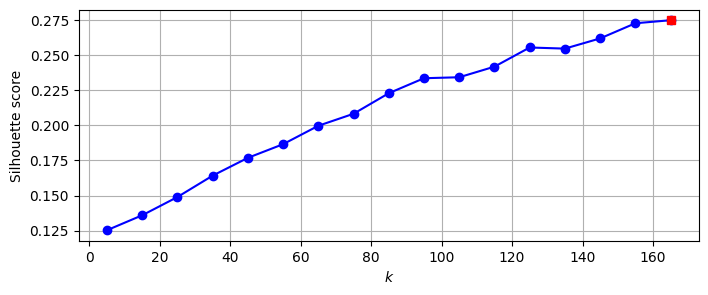

165

In [6]:
k_range = range(5, 170, 10)
kmeans_per_k = []
for k in k_range:
    print(f"k={k}")
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=42)
    kmeans.fit(X_resampled)
    kmeans_per_k.append(kmeans)
    

silhouette_scores = [silhouette_score(X_resampled, model.labels_)
                     for model in kmeans_per_k]
best_index = np.argmax(silhouette_scores)
best_k = k_range[best_index]
best_score = silhouette_scores[best_index]

plt.figure(figsize=(8, 3))
plt.plot(k_range, silhouette_scores, "bo-")
plt.xlabel("$k$")
plt.ylabel("Silhouette score")
plt.plot(best_k, best_score, "rs")
plt.grid()
plt.show()

best_k    

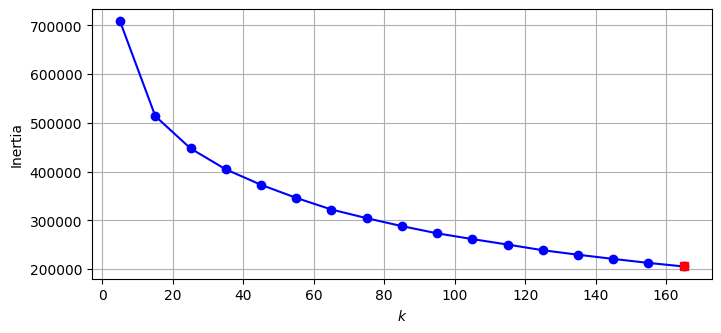

In [7]:
inertias = [model.inertia_ for model in kmeans_per_k]
best_inertia = inertias[best_index]

plt.figure(figsize=(8, 3.5))
plt.plot(k_range, inertias, "bo-")
plt.xlabel("$k$")
plt.ylabel("Inertia")
plt.plot(best_k, best_inertia, "rs")
plt.grid()
plt.show()

El número óptimo de clústeres encontrado por el algoritmo es **165**, muy superior al número esperado de clases reales (10 tipos de fractura/hueso saludable). Esto sugiere que el modelo no está convergiendo hacia una solución significativa: está fragmentando los datos en muchos grupos pequeños, probablemente capturando ruido o variaciones irrelevantes en lugar de patrones clínicos reales. De aumentar el número de clústeres, seguiria aumentando el coeficiente silhouette, pero no se obtendrían clústeres clínicamente útiles.

# Visualización de los Clusters de K-Means

Cluster 0


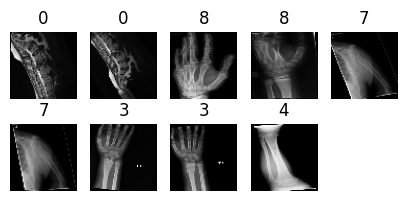

Cluster 1


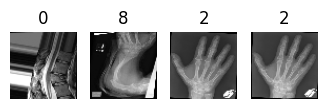

Cluster 2


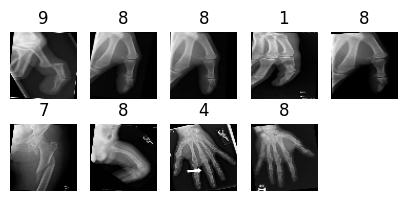

Cluster 3


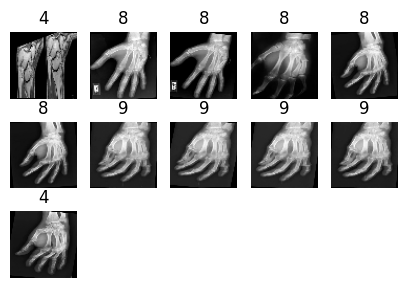

Cluster 4


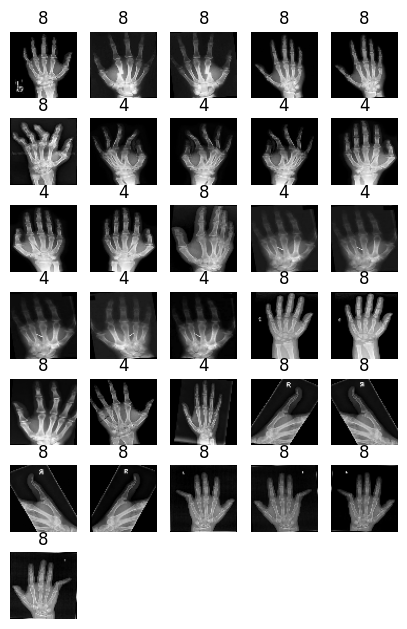

Cluster 5


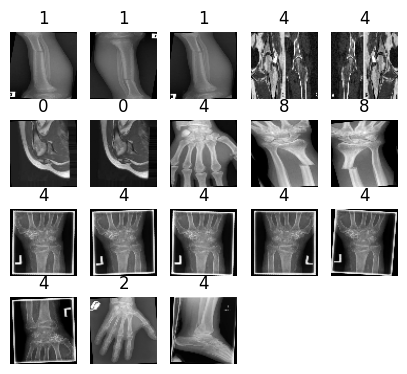

Cluster 6


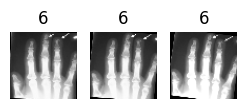

Cluster 7


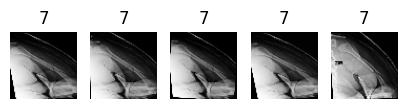

Cluster 8


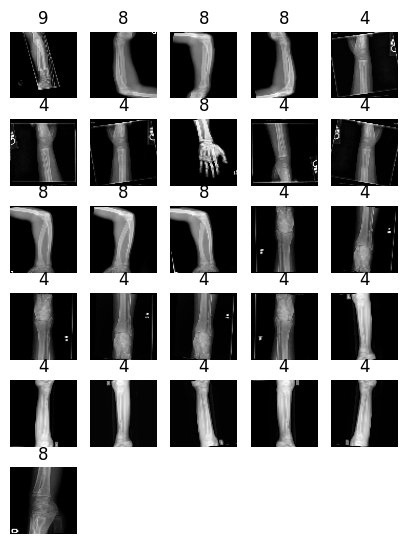

Cluster 9


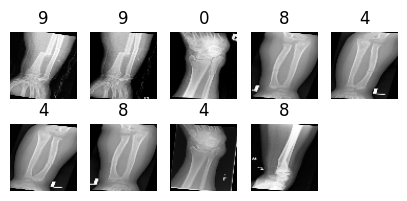

Cluster 10


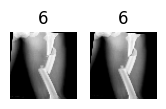

Cluster 11


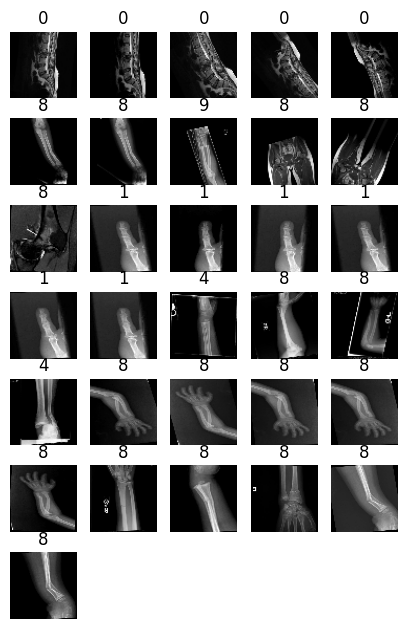

Cluster 12


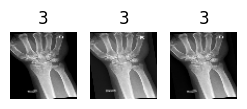

Cluster 13


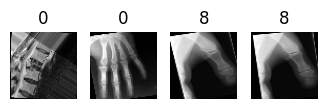

Cluster 14


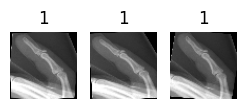

Cluster 15


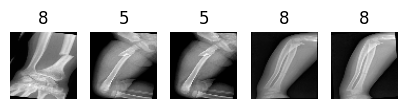

Cluster 16


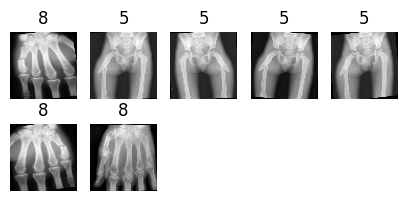

Cluster 17


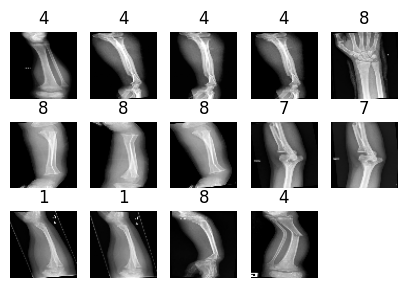

Cluster 18


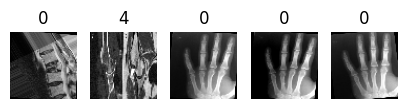

Cluster 19


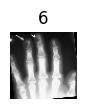

Cluster 20


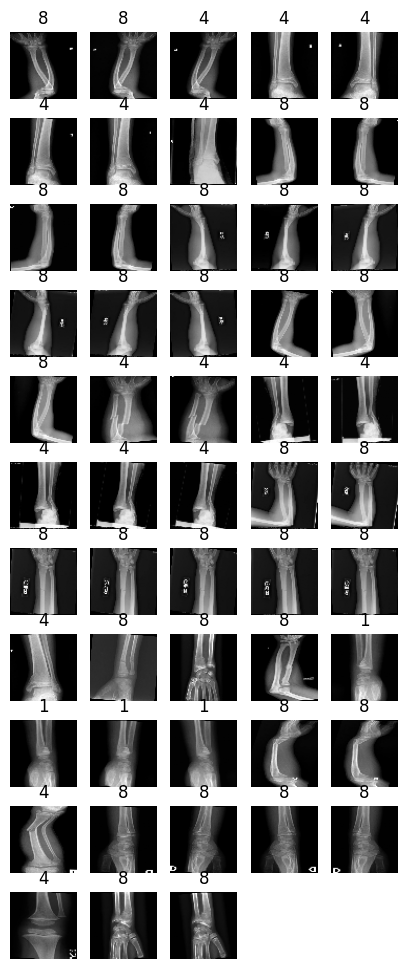

Cluster 21


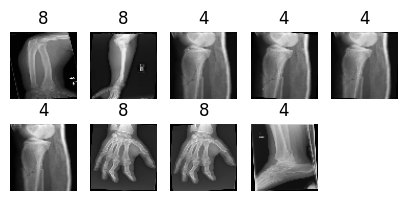

Cluster 22


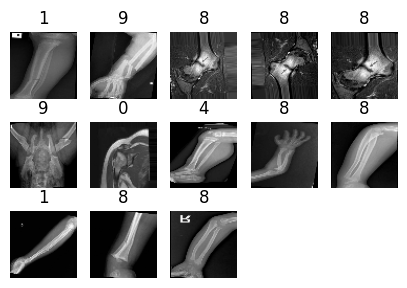

Cluster 23


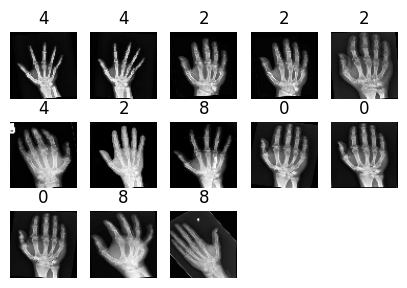

Cluster 24


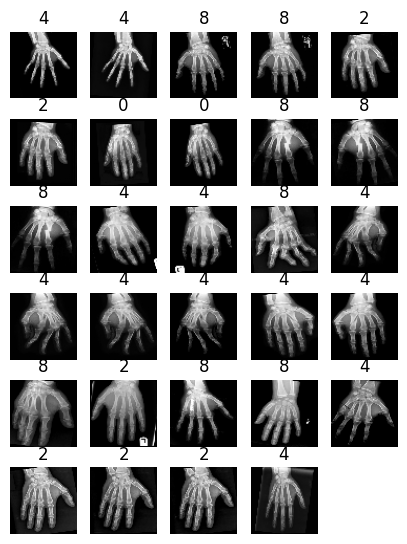

Cluster 25


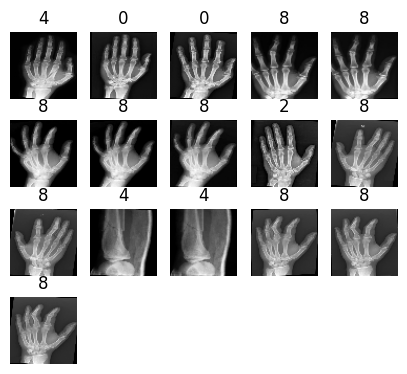

Cluster 26


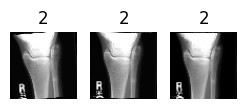

Cluster 27


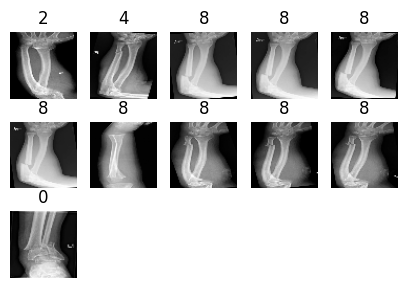

Cluster 28


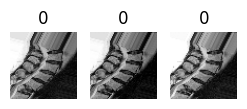

Cluster 29


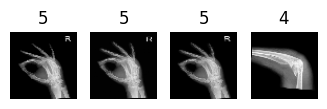

Cluster 30


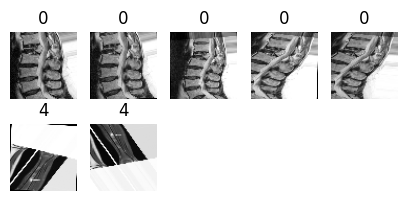

Cluster 31


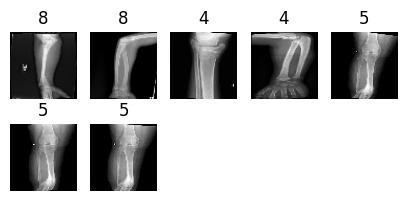

Cluster 32


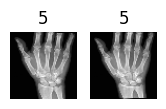

Cluster 33


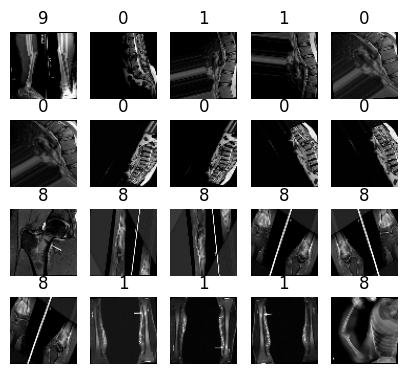

Cluster 34


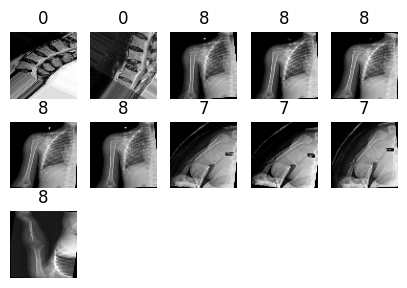

Cluster 35


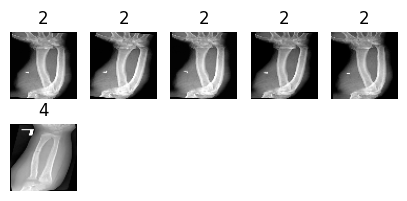

Cluster 36


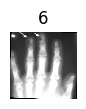

Cluster 37


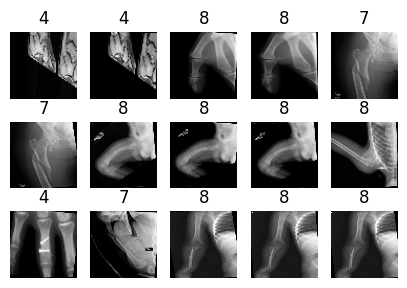

Cluster 38


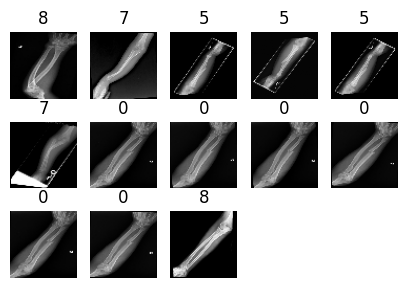

Cluster 39


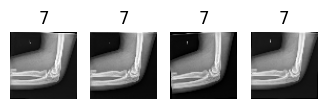

Cluster 40


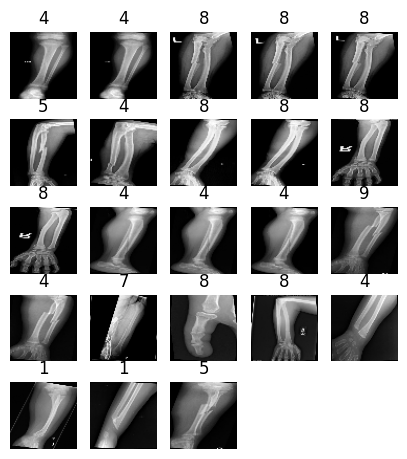

Cluster 41


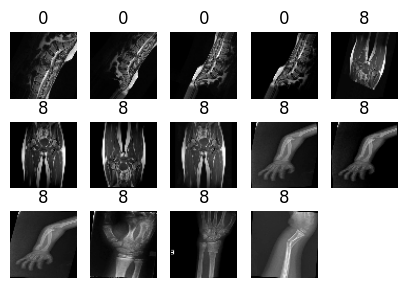

Cluster 42


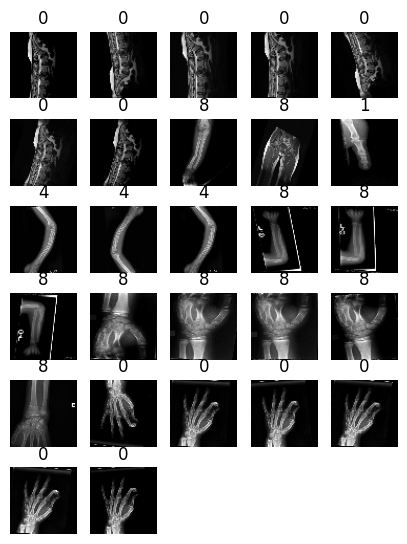

Cluster 43


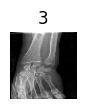

Cluster 44


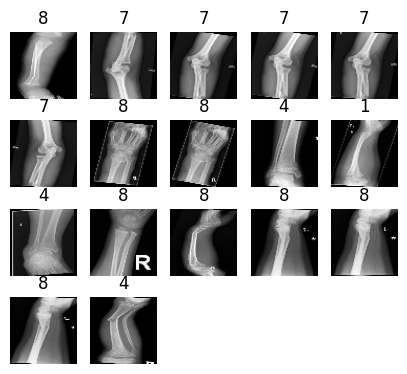

Cluster 45


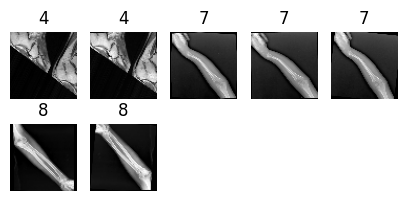

Cluster 46


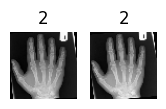

Cluster 47


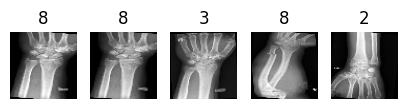

Cluster 48


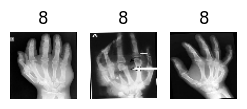

Cluster 49


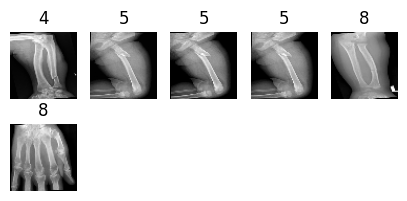

Cluster 50


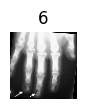

Cluster 51


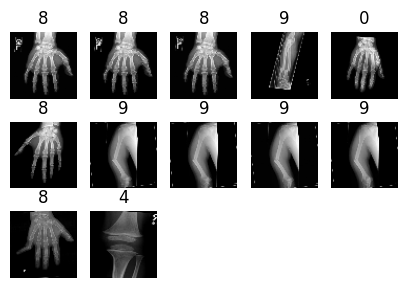

Cluster 52


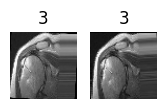

Cluster 53


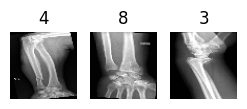

Cluster 54


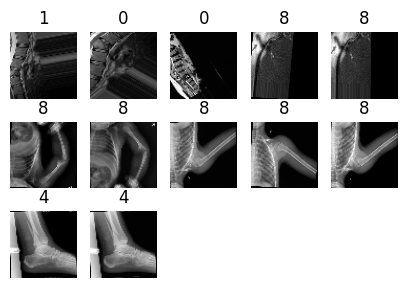

Cluster 55


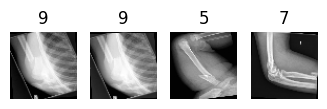

Cluster 56


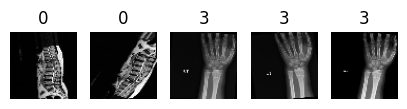

Cluster 57


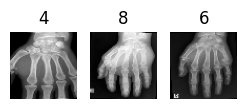

Cluster 58


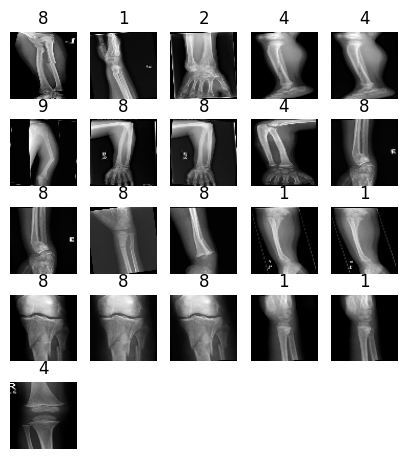

Cluster 59


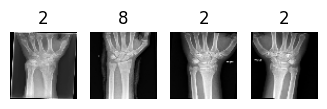

Cluster 60


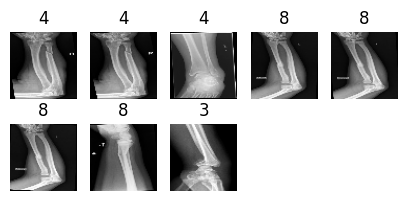

Cluster 61


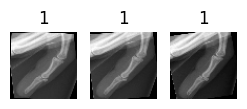

Cluster 62


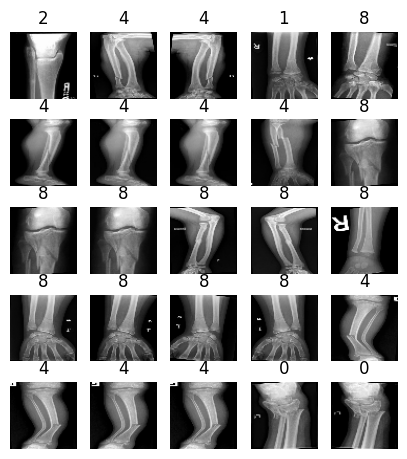

Cluster 63


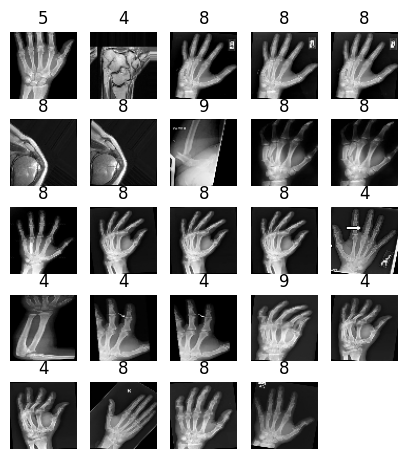

Cluster 64


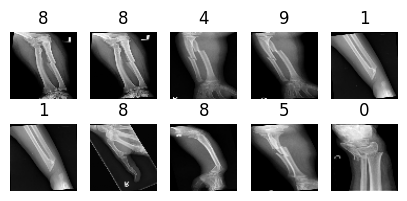

Cluster 65


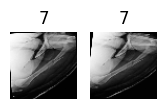

Cluster 66


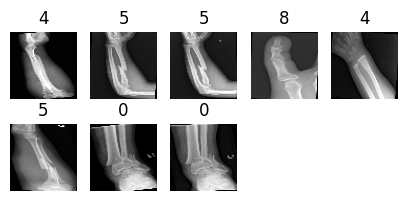

Cluster 67


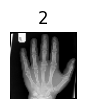

Cluster 68


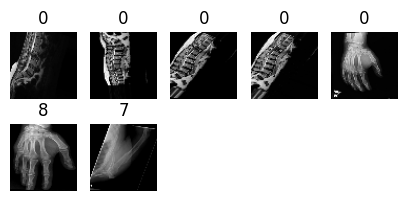

Cluster 69


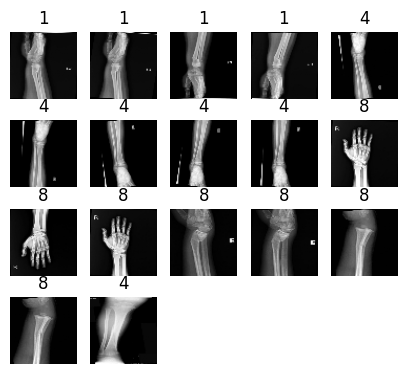

Cluster 70


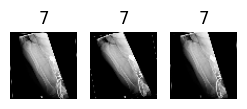

Cluster 71


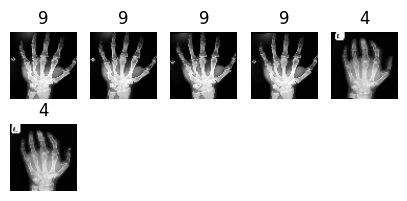

Cluster 72


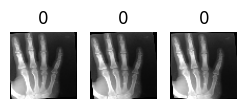

Cluster 73


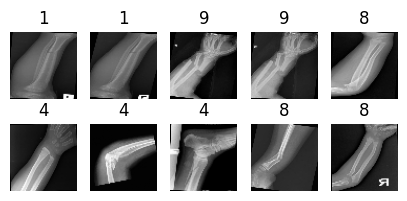

Cluster 74


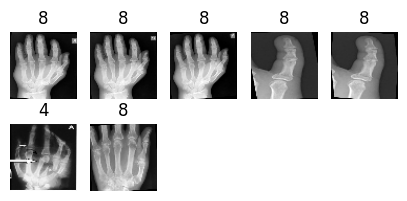

Cluster 75


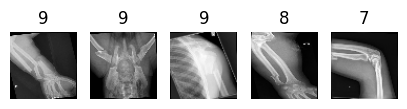

Cluster 76


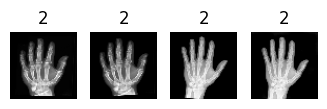

Cluster 77


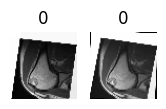

Cluster 78


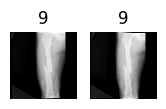

Cluster 79


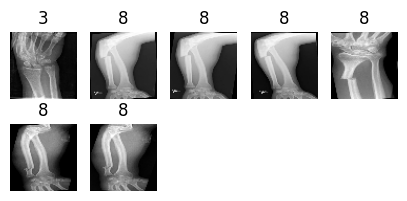

Cluster 80


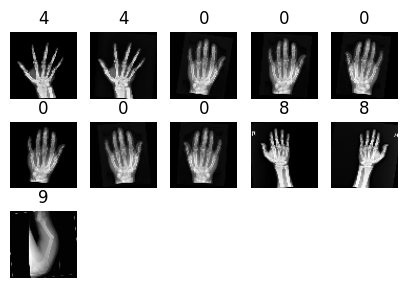

Cluster 81


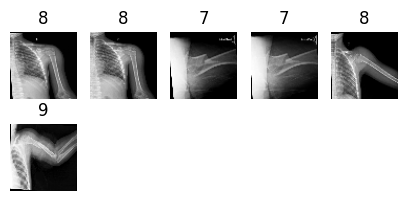

Cluster 82


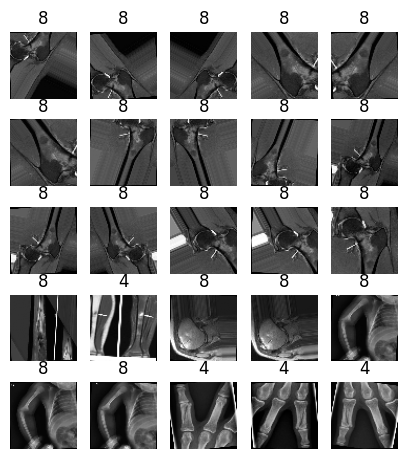

Cluster 83


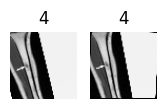

Cluster 84


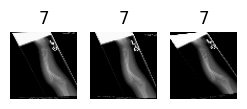

Cluster 85


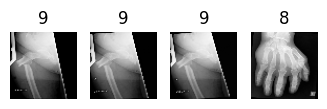

Cluster 86


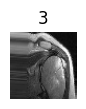

Cluster 87


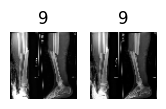

Cluster 88


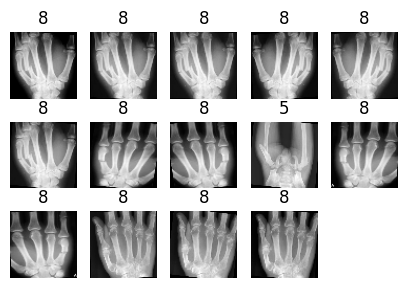

Cluster 89


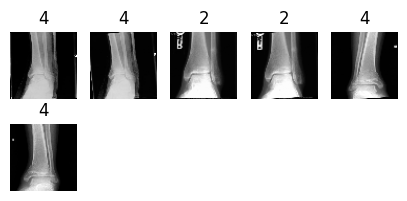

Cluster 90


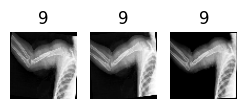

Cluster 91


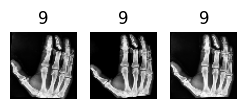

Cluster 92


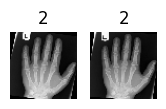

Cluster 93


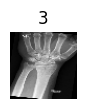

Cluster 94


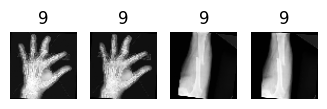

Cluster 95


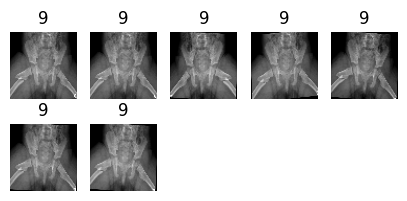

Cluster 96


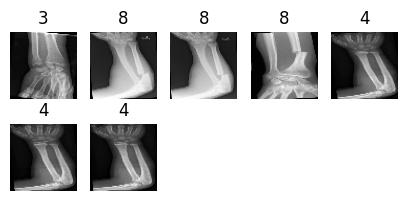

Cluster 97


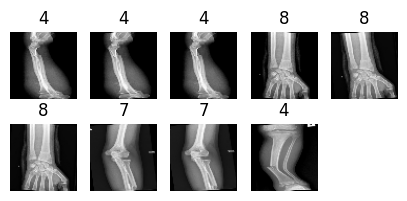

Cluster 98


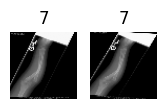

Cluster 99


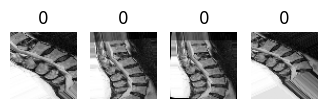

Cluster 100


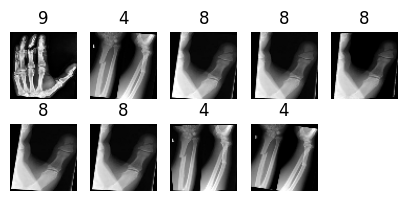

Cluster 101


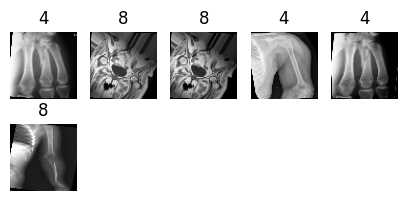

Cluster 102


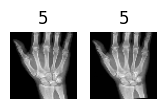

Cluster 103


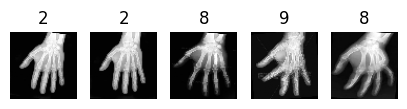

Cluster 104


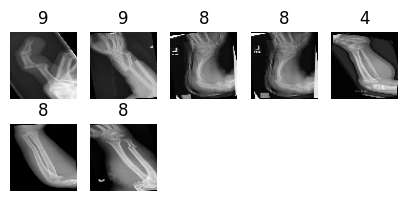

Cluster 105


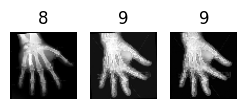

Cluster 106


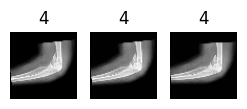

Cluster 107


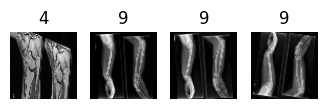

Cluster 108


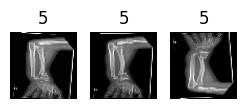

Cluster 109


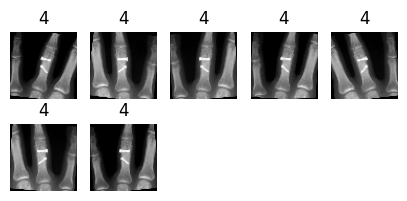

Cluster 110


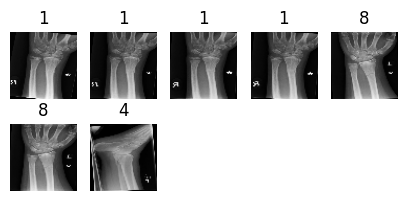

Cluster 111


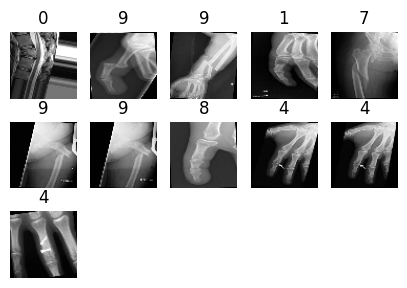

Cluster 112


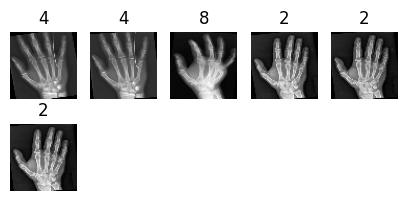

Cluster 113


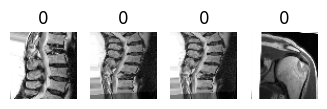

Cluster 114


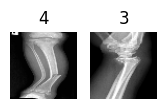

Cluster 115


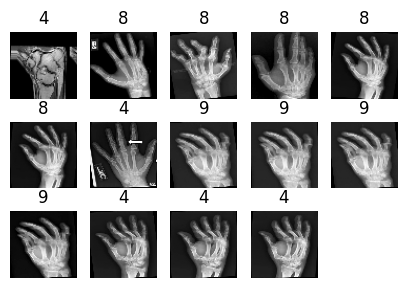

Cluster 116


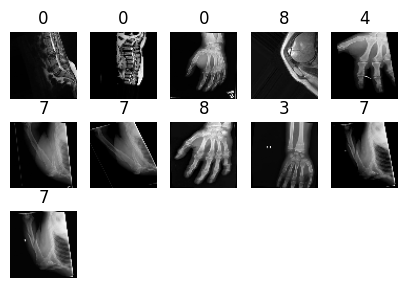

Cluster 117


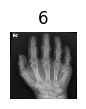

Cluster 118


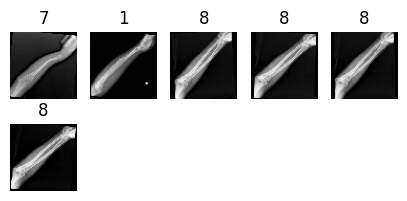

Cluster 119


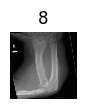

Cluster 120


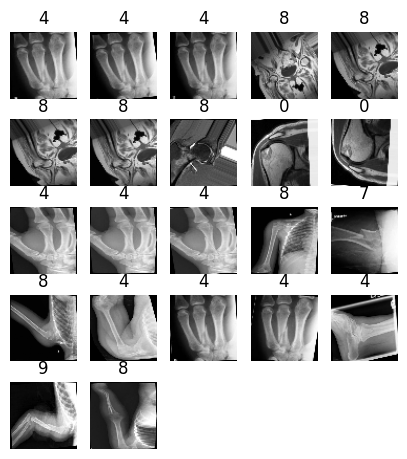

Cluster 121


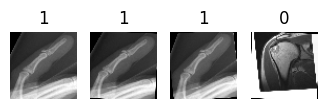

Cluster 122


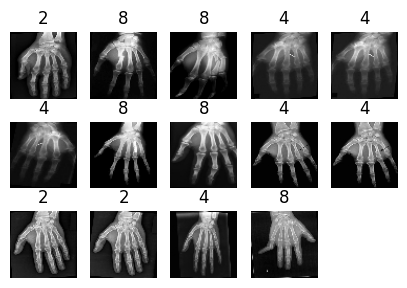

Cluster 123


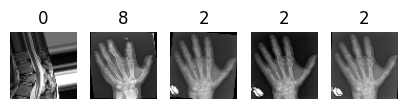

Cluster 124


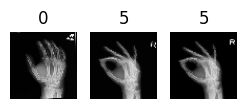

Cluster 125


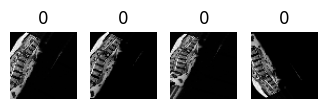

Cluster 126


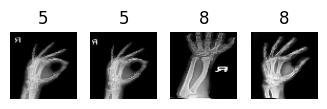

Cluster 127


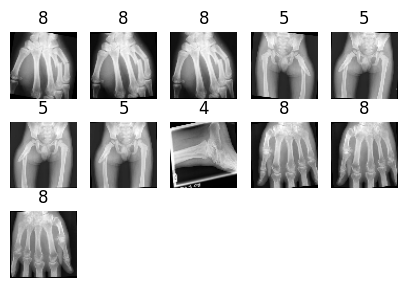

Cluster 128


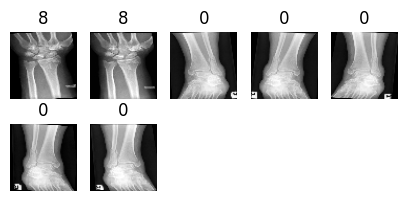

Cluster 129


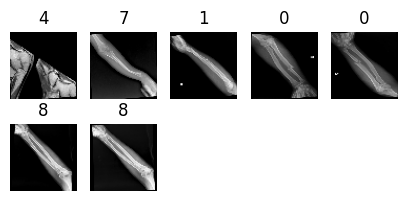

Cluster 130


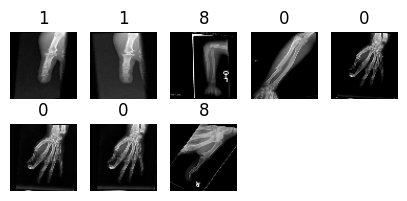

Cluster 131


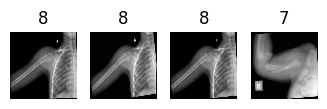

Cluster 132


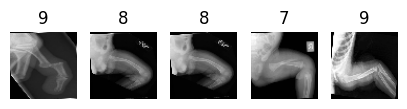

Cluster 133


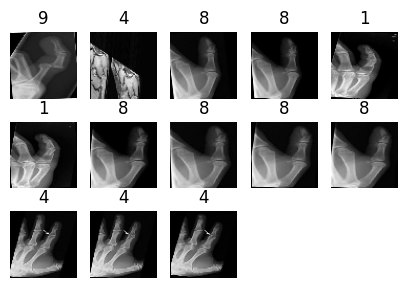

Cluster 134


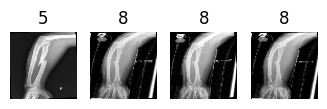

Cluster 135


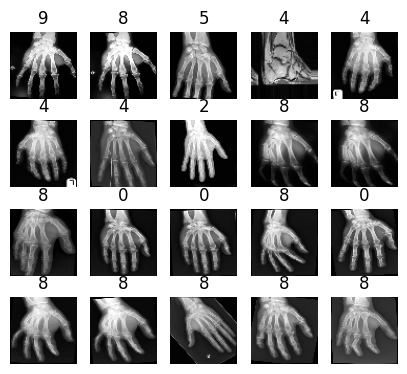

Cluster 136


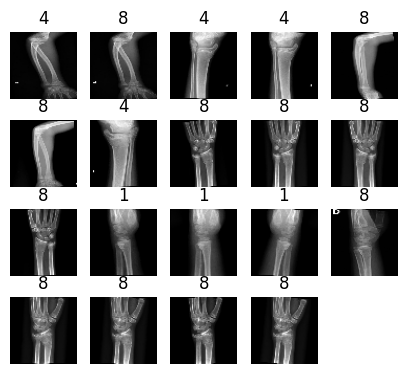

Cluster 137


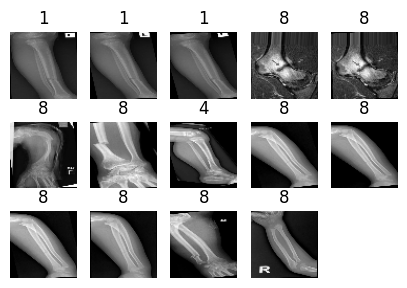

Cluster 138


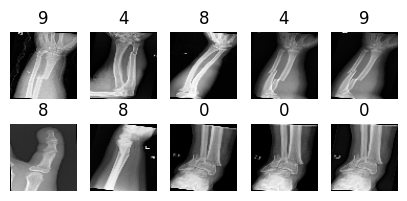

Cluster 139


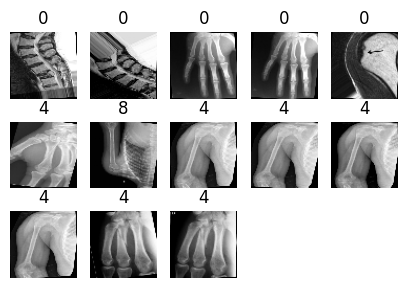

Cluster 140


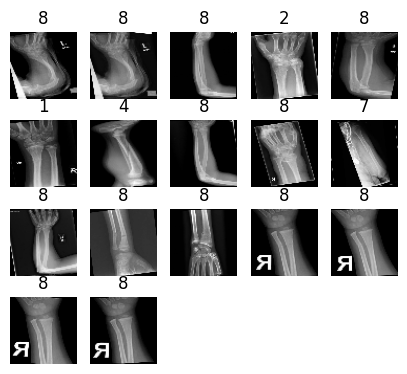

Cluster 141


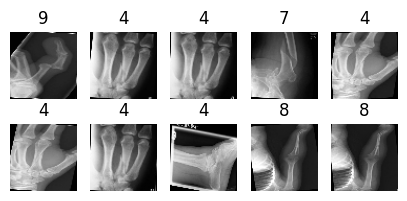

Cluster 142


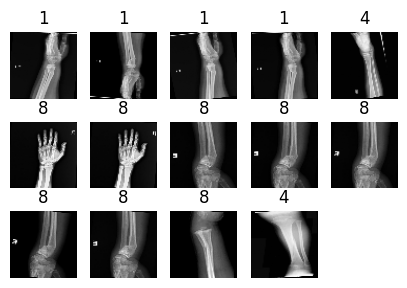

Cluster 143


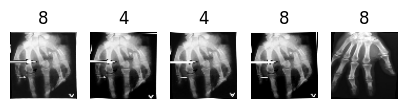

Cluster 144


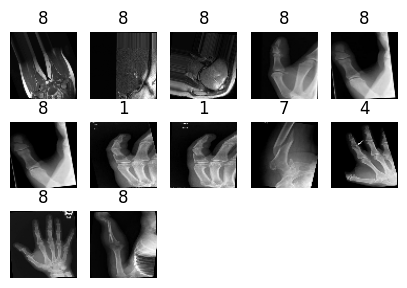

Cluster 145


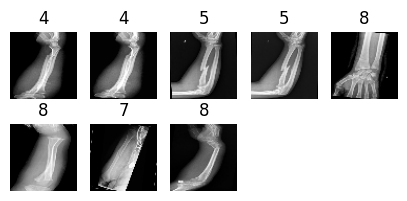

Cluster 146


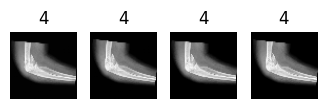

Cluster 147


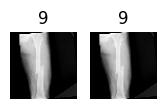

Cluster 148


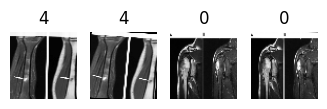

Cluster 149


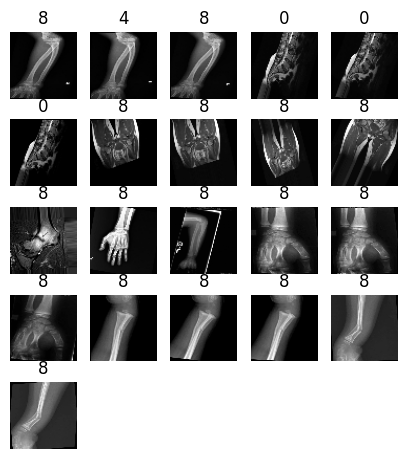

Cluster 150


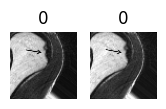

Cluster 151


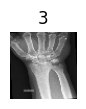

Cluster 152


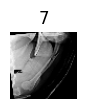

Cluster 153


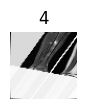

Cluster 154


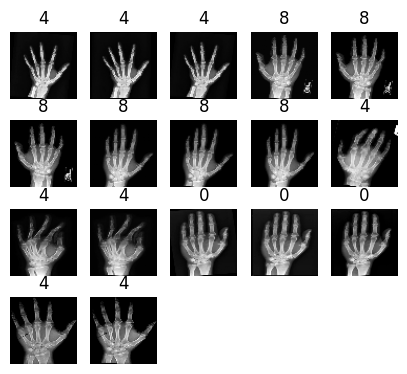

Cluster 155


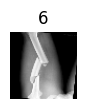

Cluster 156


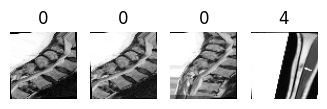

Cluster 157


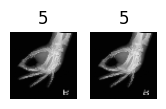

Cluster 158


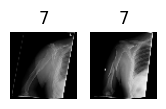

Cluster 159


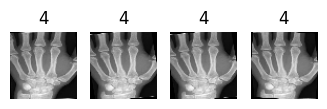

Cluster 160


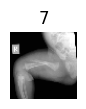

Cluster 161


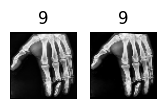

Cluster 162


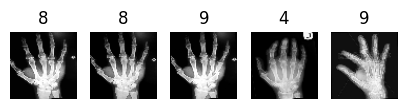

Cluster 163


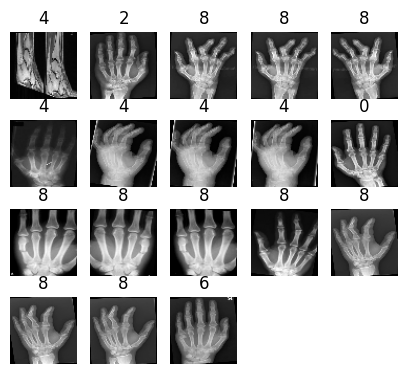

Cluster 164


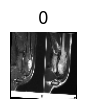

In [8]:
best_model = kmeans_per_k[best_index]

def plot_fractures(fractures, labels, n_cols=5):
    """
    Visualiza un conjunto de imágenes de fracturas dispuestas en una grilla.

    Args:
        fractures (np.array): Un array de imágenes aplanadas (vectores) de tamaño (n_imagenes, 64*64).
        labels (list): Una lista de etiquetas correspondientes a cada imagen.
        n_cols (int): Número de columnas en la grilla de visualización.
    """
    # Redimensiona las imágenes a su forma original (64x64)
    fractures = fractures.reshape(-1, 64, 64)
    
    # Calcula el número de filas necesarias para la grilla
    n_rows = (len(fractures) - 1) // n_cols + 1
    
    # Crea una figura para la visualización
    plt.figure(figsize=(n_cols, n_rows * 1.1))
    
    # Itera sobre cada imagen y su etiqueta correspondiente
    for index, (bone, label) in enumerate(zip(fractures, labels)):
        # Crea un subplot para cada imagen
        plt.subplot(n_rows, n_cols, index + 1)
        
        # Muestra la imagen en escala de grises
        plt.imshow(bone, cmap="gray")
        
        # Desactiva los ejes
        plt.axis("off")
        
        # Establece el título del subplot con la etiqueta de la imagen
        plt.title(label)
    
    # Muestra la figura completa
    plt.show()

# Itera sobre cada cluster encontrado por el modelo K-means
for cluster_id in np.unique(best_model.labels_):
    print("Cluster", cluster_id)
    
    # Crea una máscara booleana para seleccionar las imágenes pertenecientes al cluster actual
    in_cluster = best_model.labels_==cluster_id
    
    # Selecciona las imágenes y etiquetas correspondientes al cluster actual
    # Usamos X_resampled (datos sobremuestreados) para obtener los índices
    # correspondientes en el conjunto de entrenamiento original
    
    # ¡OJO! Esto solo funciona si SMOTE no modifica el orden de los datos originales
    # y solo añade datos sintéticos al final.  Si SMOTE reordena, esto fallará.
    
    # Obtiene los índices de los datos originales que pertenecen al cluster
    original_indices = np.where(in_cluster[:len(X_train)])[0]
    
    # Selecciona las imágenes y etiquetas correspondientes del conjunto original
    fractures = X_train[original_indices]
    labels = y_train[original_indices]
    
    # Llama a la función para visualizar las fracturas del cluster actual
    plot_fractures(fractures, labels)

# Modelado con Mezclas Gaussianas (GMM)

A diferencia de K-means, que asigna cada punto a un único clúster (asignación dura), los Modelos de Mezclas Gaussianas (GMM) son un enfoque probabilístico (asignación suave). GMM asume que los puntos de datos son generados a partir de una mezcla de varias distribuciones gaussianas con parámetros desconocidos.

### Características Principales:
- **Asignación Probabilística**: GMM calcula la probabilidad de que cada punto de datos pertenezca to todos los clústeres. Esto es útil para puntos que se encuentran en la intersección de varios grupos.
- **Flexibilidad de Clústeres**: Permite clústeres con formas elípticas (covarianzas variables), a diferencia de K-means que asume clústeres esféricos.
- **Criterio de Información Bayesiano (BIC)**: Para seleccionar el número óptimo de componentes (clústeres), se utiliza comúnmente el BIC. El modelo con el menor valor de BIC es generalmente el preferido, ya que equilibra la bondad de ajuste con la complejidad del modelo.

A continuación, se implementará GMM y se utilizará el BIC para determinar el número óptimo de clústeres.

In [9]:
from sklearn.mixture import GaussianMixture

# Evaluar GMM con diferentes números de componentes usando BIC
n_components_range = range(5, 170, 10)
bic_scores = []
gmm_models = []
aic_scores = []

for n_components in n_components_range:
    print(f"Probando GMM con n_components={n_components}")
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    gmm.fit(X_resampled)
    bic_scores.append(gmm.bic(X_resampled))
    aic_scores.append(gmm.aic(X_resampled))
    gmm_models.append(gmm)

Probando GMM con n_components=5
Probando GMM con n_components=15
Probando GMM con n_components=15
Probando GMM con n_components=25
Probando GMM con n_components=25
Probando GMM con n_components=35
Probando GMM con n_components=35
Probando GMM con n_components=45
Probando GMM con n_components=45
Probando GMM con n_components=55
Probando GMM con n_components=55
Probando GMM con n_components=65
Probando GMM con n_components=65
Probando GMM con n_components=75
Probando GMM con n_components=75
Probando GMM con n_components=85
Probando GMM con n_components=85
Probando GMM con n_components=95
Probando GMM con n_components=95
Probando GMM con n_components=105
Probando GMM con n_components=105
Probando GMM con n_components=115
Probando GMM con n_components=115
Probando GMM con n_components=125
Probando GMM con n_components=125
Probando GMM con n_components=135
Probando GMM con n_components=135
Probando GMM con n_components=145
Probando GMM con n_components=145
Probando GMM con n_components=155


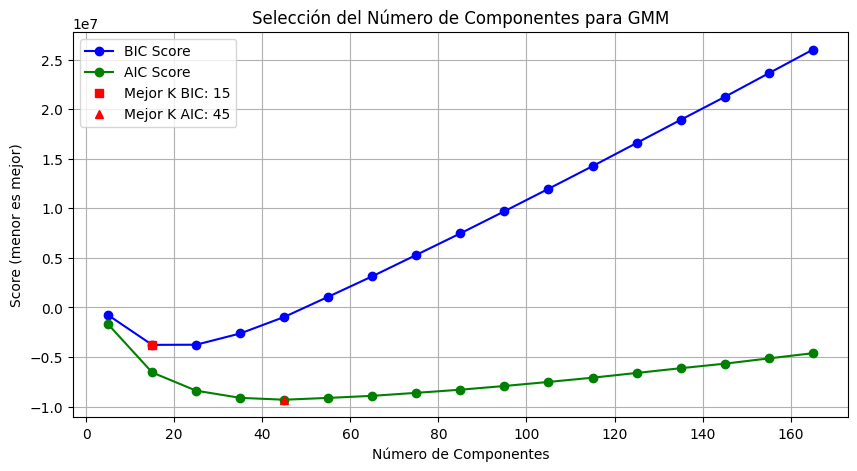

El número óptimo de componentes según BIC es: 15
El número óptimo de componentes según AIC es: 45


In [10]:
# Encontrar el mejor número de componentes
best_gmm_index = np.argmin(bic_scores)
best_aic_index = np.argmin(aic_scores)
best_n_components = n_components_range[best_gmm_index]
best_gmm_model = gmm_models[min(best_gmm_index, best_aic_index)]

# Visualizar los scores BIC
plt.figure(figsize=(10, 5))
plt.plot(n_components_range, bic_scores, "bo-", label="BIC Score")
plt.plot(n_components_range, aic_scores, "go-", label="AIC Score")
plt.xlabel('Número de Componentes')
plt.ylabel('Score (menor es mejor)')
plt.title('Selección del Número de Componentes para GMM')
plt.plot(best_n_components, bic_scores[best_gmm_index], "rs", label=f'Mejor K BIC: {best_n_components}')
plt.plot(n_components_range[best_aic_index], aic_scores[best_aic_index], "r^", label=f'Mejor K AIC: {n_components_range[best_aic_index]}')
plt.grid()
plt.legend()
plt.show()

print(f"El número óptimo de componentes según BIC es: {best_n_components}")
print(f"El número óptimo de componentes según AIC es: {n_components_range[best_aic_index]}")

# Modelado con Clustering Jerárquico

El **clustering jerárquico** es una técnica de agrupamiento no supervisado que organiza los datos en una estructura de árbol llamada **dendrograma**, donde cada nodo representa un grupo de datos. A diferencia de métodos como K-means, el clustering jerárquico no requiere especificar el número de clústeres de antemano; en su lugar, los clústeres se forman fusionando o dividiendo grupos de manera sucesiva según la similitud entre los datos.

Existen dos enfoques principales:
- **Aglomerativo (bottom-up):** Comienza con cada punto como un clúster individual y fusiona los más similares en cada paso hasta formar un solo clúster.
- **Divisivo (top-down):** Comienza con todos los puntos en un solo clúster y los divide sucesivamente.

El resultado es un dendrograma que permite visualizar la estructura jerárquica de los datos y seleccionar el número óptimo de clústeres cortando el árbol en el nivel deseado. Esta técnica es especialmente útil para descubrir relaciones anidadas y patrones complejos en conjuntos de datos como imágenes médicas.

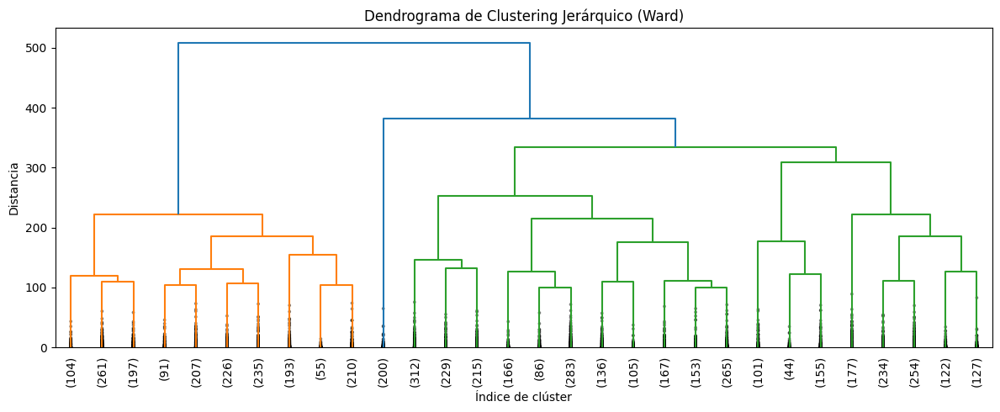

Coeficiente de Silueta para Clustering Jerárquico: 0.2682


In [11]:
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.metrics import silhouette_score

import matplotlib.pyplot as plt

# Realizar clustering jerárquico aglomerativo (método ward)
Z = linkage(X_resampled, method='ward')

# Visualizar el dendrograma (solo los primeros 200 puntos para claridad)
plt.figure(figsize=(12, 5))
dendrogram(Z, truncate_mode='lastp', p=30, leaf_rotation=90., leaf_font_size=10., show_contracted=True)
plt.title('Dendrograma de Clustering Jerárquico (Ward)')
plt.xlabel('Índice de clúster')
plt.ylabel('Distancia')
plt.tight_layout()
plt.show()

# Seleccionar el número de clústeres (por ejemplo, igual al best_k de K-means)
n_clusters_hier = best_k
hier_labels = fcluster(Z, n_clusters_hier, criterion='maxclust')

# Evaluar el coeficiente de silueta
hier_silhouette = silhouette_score(X_resampled, hier_labels)
print(f"Coeficiente de Silueta para Clustering Jerárquico: {hier_silhouette:.4f}")

# Modelado con DBSCAN

DBSCAN (Density-Based Spatial Clustering of Applications with Noise) es un algoritmo de clustering no supervisado que agrupa puntos de datos en función de la densidad local. A diferencia de K-means, DBSCAN no requiere especificar el número de clústeres previamente y es capaz de identificar clústeres de forma arbitraria, así como detectar puntos atípicos (ruido).

## Características principales:
- **Agrupamiento basado en densidad:** Forma clústeres donde los puntos están densamente agrupados y separa regiones de baja densidad como ruido.
- **No requiere número de clústeres:** El usuario define dos parámetros clave: `eps` (radio de vecindad) y `min_samples` (mínimo de puntos para formar un clúster).
- **Identificación de ruido:** Los puntos que no pertenecen a ningún clúster se etiquetan como ruido.
- **Robusto a formas arbitrarias:** Puede encontrar clústeres de cualquier forma, no solo esféricos.

DBSCAN es especialmente útil cuando los datos contienen clústeres de densidad variable y ruido, como ocurre frecuentemente en imágenes médicas. Sin embargo, su rendimiento depende fuertemente de la correcta elección de los parámetros `eps` y `min_samples`.

eps=0.50, clusters=34, silhouette=-0.3840
eps=1.00, clusters=97, silhouette=-0.3042
eps=1.00, clusters=97, silhouette=-0.3042
eps=1.50, clusters=157, silhouette=-0.1909
eps=1.50, clusters=157, silhouette=-0.1909
eps=2.00, clusters=189, silhouette=-0.0798
eps=2.00, clusters=189, silhouette=-0.0798
eps=2.50, clusters=192, silhouette=-0.0338
eps=2.50, clusters=192, silhouette=-0.0338
eps=3.00, clusters=192, silhouette=0.0100
eps=3.00, clusters=192, silhouette=0.0100
eps=3.50, clusters=172, silhouette=0.0027
eps=3.50, clusters=172, silhouette=0.0027
eps=4.00, clusters=157, silhouette=-0.0140
eps=4.00, clusters=157, silhouette=-0.0140
eps=4.50, clusters=142, silhouette=-0.0731
eps=4.50, clusters=142, silhouette=-0.0731
eps=5.00, clusters=121, silhouette=-0.1115
eps=5.00, clusters=121, silhouette=-0.1115


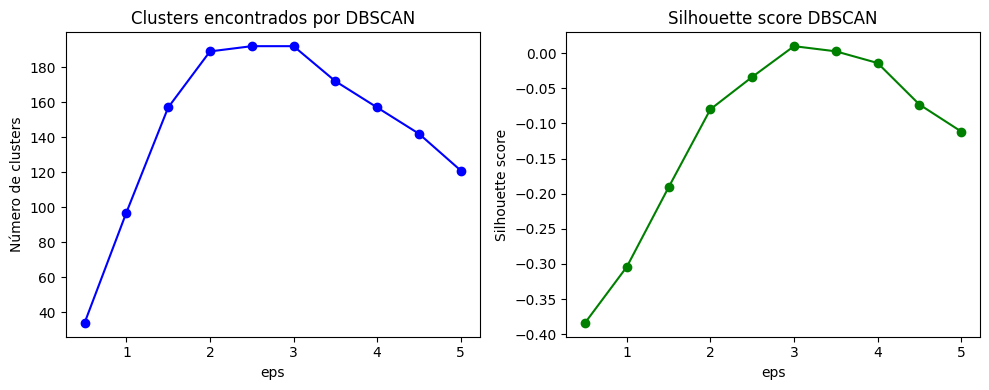

Mejor eps: 3.00, clusters: 192, silhouette: 0.0100


In [12]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

# Prueba diferentes valores de eps para DBSCAN
eps_values = np.linspace(0.5, 5.0, 10)
silhouette_scores_dbscan = []
n_clusters_dbscan = []

for eps in eps_values:
    dbscan = DBSCAN(eps=eps, min_samples=5)
    labels = dbscan.fit_predict(X_resampled)
    # DBSCAN asigna -1 a ruido, ignoramos si todos son ruido o un solo cluster
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    n_clusters_dbscan.append(n_clusters)
    if n_clusters > 1:
        score = silhouette_score(X_resampled, labels)
    else:
        score = -1
    silhouette_scores_dbscan.append(score)
    print(f"eps={eps:.2f}, clusters={n_clusters}, silhouette={score:.4f}")

# Visualiza el número de clusters y el score de silueta
plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.plot(eps_values, n_clusters_dbscan, 'bo-')
plt.xlabel('eps')
plt.ylabel('Número de clusters')
plt.title('Clusters encontrados por DBSCAN')

plt.subplot(1,2,2)
plt.plot(eps_values, silhouette_scores_dbscan, 'go-')
plt.xlabel('eps')
plt.ylabel('Silhouette score')
plt.title('Silhouette score DBSCAN')
plt.tight_layout()
plt.show()

# Selecciona el mejor eps (mayor score de silueta con más de 1 cluster)
valid_scores = [(i, s) for i, s in enumerate(silhouette_scores_dbscan) if n_clusters_dbscan[i] > 1]
if valid_scores:
    best_idx = max(valid_scores, key=lambda x: x[1])[0]
    best_eps = eps_values[best_idx]
    best_dbscan = DBSCAN(eps=best_eps, min_samples=5).fit(X_resampled)
    print(f"Mejor eps: {best_eps:.2f}, clusters: {n_clusters_dbscan[best_idx]}, silhouette: {silhouette_scores_dbscan[best_idx]:.4f}")
    dbscan_silhouette = silhouette_scores_dbscan[best_idx]
else:
    print("No se encontraron clusters válidos con DBSCAN.")

# Modelado con BIRCH

BIRCH (Balanced Iterative Reducing and Clustering using Hierarchies) es un algoritmo de clustering no supervisado diseñado específicamente para grandes conjuntos de datos. Su principal ventaja es su capacidad para realizar el clustering con una sola pasada sobre los datos, lo que lo hace muy eficiente en términos de memoria y tiempo.

### ¿Cómo funciona?
BIRCH construye una estructura de árbol llamada **Clustering Feature Tree (CF Tree)** para resumir los datos. En lugar de almacenar todos los puntos, almacena "Características de Clustering" (CF) en los nodos del árbol, que capturan estadísticas clave de los sub-clústeres (número de puntos, suma lineal y suma de cuadrados).

### Parámetros Clave:
- **`threshold`**: El radio máximo de un sub-clúster en una hoja del CF Tree. Un valor más bajo produce más clústeres y un árbol más grande.
- **`branching_factor`**: El número máximo de entradas CF en cada nodo del árbol.
- **`n_clusters`**: El número final de clústeres a generar después de construir el árbol. Se puede dejar como `None` para que BIRCH lo determine o especificar un número, como en K-means.

BIRCH es ideal como un pre-procesador para otros algoritmos o como un método de clustering rápido por sí mismo.

In [13]:
from sklearn.cluster import Birch

# Instanciar y ajustar el modelo BIRCH
# Dejamos n_clusters igual al mejor k de K-means para una comparación directa
birch_model = Birch(n_clusters=best_k)
birch_model.fit(X_resampled)

# Obtener las etiquetas de los clústeres
birch_labels = birch_model.predict(X_resampled)

# Evaluar el rendimiento con el coeficiente de silueta
birch_silhouette = silhouette_score(X_resampled, birch_labels)
print(f"Coeficiente de Silueta para BIRCH: {birch_silhouette:.4f}")

Coeficiente de Silueta para BIRCH: 0.2713


Entrenando el modelo K-means...
Mapeo de Clúster a Clase creado:
{np.int32(0): np.int64(3), np.int32(1): np.int64(2), np.int32(2): np.int64(7), np.int32(3): np.int64(9), np.int32(4): np.int64(4), np.int32(5): np.int64(1), np.int32(6): np.int64(6), np.int32(7): np.int64(7), np.int32(8): np.int64(4), np.int32(9): np.int64(9), np.int32(10): np.int64(6), np.int32(11): np.int64(1), np.int32(12): np.int64(3), np.int32(13): np.int64(0), np.int32(14): np.int64(1), np.int32(15): np.int64(5), np.int32(16): np.int64(5), np.int32(17): np.int64(7), np.int32(18): np.int64(0), np.int32(19): np.int64(6), np.int32(20): np.int64(1), np.int32(21): np.int64(6), np.int32(22): np.int64(9), np.int32(23): np.int64(2), np.int32(24): np.int64(2), np.int32(25): np.int64(2), np.int32(26): np.int64(2), np.int32(27): np.int64(8), np.int32(28): np.int64(0), np.int32(29): np.int64(5), np.int32(30): np.int64(0), np.int32(31): np.int64(5), np.int32(32): np.int64(5), np.int32(33): np.int64(1), np.int32(34): np.int64(7),

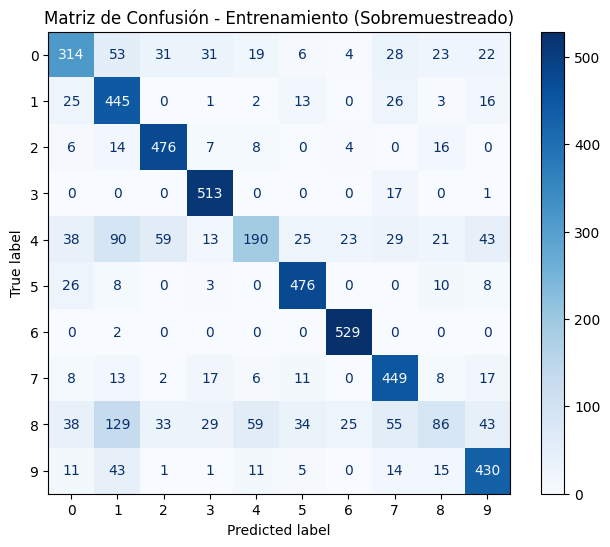

Reporte de Clasificación para Matriz de Confusión - Entrenamiento (Sobremuestreado):
              precision    recall  f1-score   support

           0       0.67      0.59      0.63       531
           1       0.56      0.84      0.67       531
           2       0.79      0.90      0.84       531
           3       0.83      0.97      0.90       531
           4       0.64      0.36      0.46       531
           5       0.84      0.90      0.86       531
           6       0.90      1.00      0.95       531
           7       0.73      0.85      0.78       531
           8       0.47      0.16      0.24       531
           9       0.74      0.81      0.77       531

    accuracy                           0.74      5310
   macro avg       0.72      0.74      0.71      5310
weighted avg       0.72      0.74      0.71      5310


--- Matriz de Confusión - Validación ---


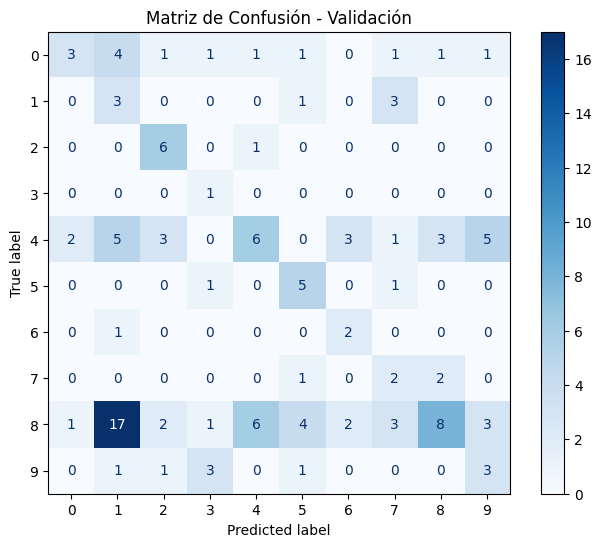

Reporte de Clasificación para Matriz de Confusión - Validación:
              precision    recall  f1-score   support

           0       0.50      0.21      0.30        14
           1       0.10      0.43      0.16         7
           2       0.46      0.86      0.60         7
           3       0.14      1.00      0.25         1
           4       0.43      0.21      0.29        28
           5       0.38      0.71      0.50         7
           6       0.29      0.67      0.40         3
           7       0.18      0.40      0.25         5
           8       0.57      0.17      0.26        47
           9       0.25      0.33      0.29         9

    accuracy                           0.30       128
   macro avg       0.33      0.50      0.33       128
weighted avg       0.44      0.30      0.30       128


--- Matriz de Confusión - Prueba ---


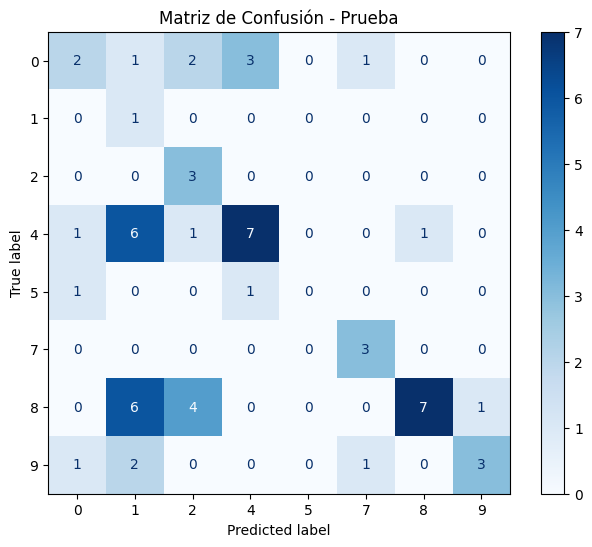

Reporte de Clasificación para Matriz de Confusión - Prueba:
              precision    recall  f1-score   support

           0       0.40      0.22      0.29         9
           1       0.06      1.00      0.12         1
           2       0.30      1.00      0.46         3
           4       0.64      0.44      0.52        16
           5       0.00      0.00      0.00         2
           7       0.60      1.00      0.75         3
           8       0.88      0.32      0.47        22
           9       0.75      0.38      0.50         8

   micro avg       0.44      0.41      0.42        64
   macro avg       0.45      0.54      0.39        64
weighted avg       0.65      0.41      0.45        64



In [14]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import warnings
warnings.filterwarnings("ignore")

# 1. Entrenar el modelo K-means y crear el mapeo
# Usamos el mejor 'k' encontrado anteriormente y los datos sobremuestreados para entrenar
print("Entrenando el modelo K-means...")
kmeans_final_model = KMeans(n_clusters=best_k, n_init=10, random_state=42)
kmeans_final_model.fit(X_resampled)

# Mapeo inteligente: cada clúster se asocia a la clase más frecuente dentro de él
# Este mapeo se crea usando los datos de entrenamiento (sobremuestreados)
cluster_predictions_train = kmeans_final_model.predict(X_resampled)
cluster_mapping = {}
for cluster_id in np.unique(cluster_predictions_train):
    mask = cluster_predictions_train == cluster_id
    # Encontrar la etiqueta real más común en ese clúster
    most_common_label = Counter(y_resampled[mask]).most_common(1)[0][0]
    cluster_mapping[cluster_id] = most_common_label

print("Mapeo de Clúster a Clase creado:")
print(cluster_mapping)

# 2. Función de evaluación simplificada
def plot_confusion_matrix_and_report(model, X_data, y_true, mapping, title='Matriz de Confusión'):
    """
    Genera y muestra una matriz de confusión y un reporte de clasificación para un conjunto de datos.
    """
    # Predecir los clústeres para los datos de entrada
    cluster_predictions = model.predict(X_data)
    
    # Aplicar el mapeo para obtener las etiquetas de clase predichas
    y_pred = np.array([mapping.get(cluster, -1) for cluster in cluster_predictions]) # -1 para clústeres no vistos
    
    # Métricas y visualización
    print(f"\n--- {title} ---")
    
    # Matriz de confusión
    labels = np.unique(y_true)
    cm = confusion_matrix(y_true, y_pred, labels=labels)
    disp = ConfusionMatrixDisplay(cm, display_labels=[str(l) for l in labels])
    
    fig, ax = plt.subplots(figsize=(8, 6))
    disp.plot(cmap='Blues', values_format='d', ax=ax)
    ax.set_title(title)
    plt.show()

    # Reporte de clasificación
    print(f"Reporte de Clasificación para {title}:")
    print(classification_report(y_true, y_pred, labels=labels, target_names=[str(l) for l in labels]))

# 3. Evaluar en los conjuntos de entrenamiento, validación y prueba
# Entrenamiento (sobremuestreado)
plot_confusion_matrix_and_report(kmeans_final_model, X_resampled, y_resampled, cluster_mapping, 
                                 title='Matriz de Confusión - Entrenamiento (Sobremuestreado)')

# Validación
plot_confusion_matrix_and_report(kmeans_final_model, X_valid_pca, y_valid, cluster_mapping, title='Matriz de Confusión - Validación')

# Prueba
plot_confusion_matrix_and_report(kmeans_final_model, X_test_pca, y_test, cluster_mapping, 
                                 title='Matriz de Confusión - Prueba')

El modelo genera resultados respetablemente buenos en el conjunto de entrenamiento pero no en los conjuntos de validación y prueba. Esto indica que el modelo está "memorizando" las respuestas, lo cual puede deberse a que las imágenes generadas por SMOTE no sean realistas desde el punto de vista clínico.

# Comparación de Modelos de Clustering

Ahora, comparemos el rendimiento de los tres algoritmos de clustering que hemos implementado: K-means, Mezclas Gaussianas (GMM) y BIRCH. La métrica principal para esta comparación será el **Coeficiente de Silueta**, que mide cuán bien definidos están los clústeres. Un valor más alto indica una mejor calidad de clustering.

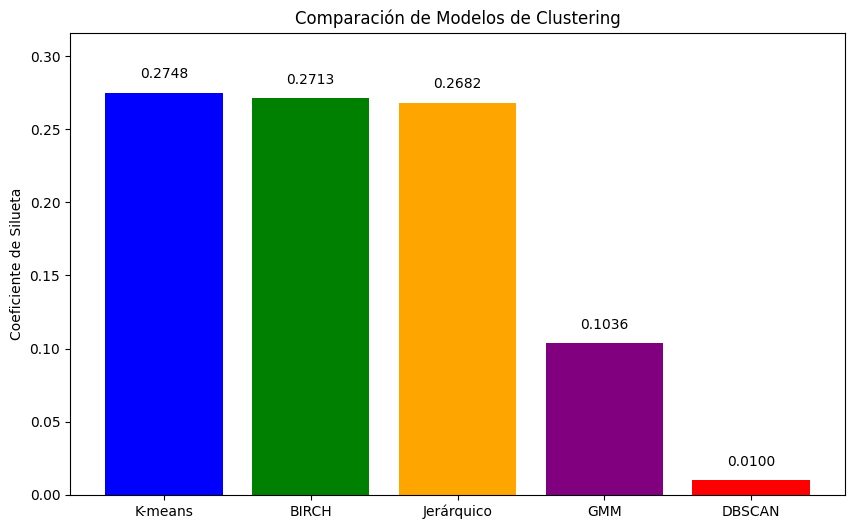

Resumen de Coeficientes de Silueta (de mejor a peor):
- K-means: 0.2748
- BIRCH: 0.2713
- Jerárquico: 0.2682
- GMM: 0.1036
- DBSCAN: 0.0100


In [15]:
# Recalcular el score de silueta para el mejor modelo GMM
gmm_labels = best_gmm_model.predict(X_resampled)
gmm_silhouette = silhouette_score(X_resampled, gmm_labels)

# Obtener el mejor score de DBSCAN

if 'valid_scores' in locals() and valid_scores:
    best_dbscan_idx = max(valid_scores, key=lambda x: x[1])[0]
    dbscan_silhouette = silhouette_scores_dbscan[best_dbscan_idx]


# Comparación de los coeficientes de silueta
scores = {
    'K-means': best_score,
    'GMM': gmm_silhouette,
    'BIRCH': birch_silhouette,
    'Jerárquico': hier_silhouette,
    'DBSCAN': dbscan_silhouette
}

# Filtrar modelos que no produjeron un score válido (como DBSCAN si falló)
valid_scores_data = {k: v for k, v in scores.items() if v > -1}

# Ordenar los scores de mayor a menor para una mejor visualización
sorted_scores = dict(sorted(valid_scores_data.items(), key=lambda item: item[1], reverse=True))


# Visualización de la comparación
plt.figure(figsize=(10, 6))
colors = ['blue', 'green', 'orange', 'purple', 'red', 'cyan']
plt.bar(sorted_scores.keys(), sorted_scores.values(), color=colors[:len(sorted_scores)])
plt.ylabel('Coeficiente de Silueta')
plt.title('Comparación de Modelos de Clustering')
plt.ylim(0, max(sorted_scores.values()) * 1.15)
for i, (model, score) in enumerate(sorted_scores.items()):
    plt.text(i, score + 0.01, f'{score:.4f}', ha='center', fontsize=10)
plt.show()

# Resumen
print("Resumen de Coeficientes de Silueta (de mejor a peor):")
for model, score in sorted_scores.items():
    print(f"- {model}: {score:.4f}")

# Conclusión del Análisis de Clustering

En este análisis, se evaluaron cinco algoritmos de clustering no supervisado (K-means, GMM, BIRCH, Clustering Jerárquico y DBSCAN) para agrupar imágenes de fracturas óseas. La métrica principal, el Coeficiente de Silueta, reveló un rendimiento general deficiente en todos los modelos.

### Resumen de Resultados
Los coeficientes de silueta obtenidos fueron:
- **K-means**: 0.275
- **BIRCH**: 0.271
- **Clustering Jerárquico**: 0.267
- **GMM**: 0.104
- **DBSCAN**: 0.01 (No encontró una estructura de clúster válida)

### Interpretación de las Métricas: Un Indicador de Complejidad

Las puntuaciones de silueta obtenidas son bajas (generalmente, valores < 0.5 indican una estructura de clústeres débil o superpuesta). Este resultado no solo refleja que los algoritmos pueden no ser los ideales para resolver este problema, también indica lo siguiente:

1.  **Alta Complejidad y Sutilidad de las Características**: Las imágenes médicas, incluso después de la reducción de dimensionalidad con PCA, contienen patrones muy sutiles y de alta variabilidad. Las diferencias visuales entre distintos tipos de fracturas, o entre una fractura leve y un hueso sano, pueden ser mínimas y no ser capturadas adecuadamente por los componentes principales que solo maximizan la varianza general.

2.  **Superposición Natural de Clases**: En la realidad clínica, no existen fronteras claras y definidas entre todas las categorías de fracturas. Algunas son visualmente muy similares, lo que lleva a una superposición natural en el espacio de características. Los algoritmos de clustering tienen dificultades para separar grupos que no son inherentemente distintos.

3.  **Limitaciones del Sobre-muestreo (SMOTE)**: Aunque SMOTE ayudó a balancear las clases, opera en el espacio de características reducido por PCA. La creación de muestras sintéticas mediante la interpolación de estos vectores abstractos puede no generar representaciones que correspondan a imágenes médicas realistas.

### Evaluación Comparativa de los Modelos

- **K-means, BIRCH y Clustering Jerárquico**: A pesar de su bajo rendimiento absoluto, estos modelos superaron a GMM y DBSCAN. Su suposición de clústeres compactos y cohesivos parece ser un modelo simplificado que, aunque imperfecto, se ajusta mejor a los datos que las suposiciones más complejas de GMM o la detección de densidad de DBSCAN. El rendimiento casi idéntico de BIRCH lo posiciona como una alternativa computacionalmente eficiente.

- **GMM**: Su pobre desempeño sugiere que la flexibilidad para modelar clústeres elípticos no fue una ventaja. Por el contrario, la mayor complejidad del modelo probablemente llevó a un sobreajuste a ruido o a la creación de clústeres poco significativos, penalizado por el criterio BIC y reflejado en la puntuación de silueta.

- **DBSCAN**: El fracaso de DBSCAN para encontrar una estructura de clúster válida (indicado por un score de -1) sugiere que los datos no tienen regiones de densidad claramente definidas que el algoritmo pueda separar. Esto refuerza la idea de que los clústeres están muy superpuestos o tienen densidades muy variables.

### Conclusión Final

Los resultados indican que, si bien **K-means es el mejor modelo relativo** dentro de este análisis, **ninguno de los algoritmos de clustering probados es suficiente por sí solo para lograr una segmentación clínicamente fiable** de las imágenes de fracturas.

El bajo Coeficiente de Silueta es una señal clara de que los métodos no supervisados, aplicados directamente sobre las características extraídas por PCA, luchan por encontrar una estructura clara en los datos. Para mejorar los resultados, los pasos futuros deberían centrarse en:

1.  **Modelos Avanzados**: Utilizar técnicas más sofisticadas (como redes neuronales) que sean capaces de diferenciar patrones más sutiles en las imágenes.
2.  **Validación por Expertos**: La inspección visual de los clústeres por parte de un radiólogo es indispensable para determinar si, a pesar de la baja puntuación, se ha descubierto algún patrón clínicamente relevante.
3.  **Enfoques Híbridos o Supervisados**: Es probable que para una clasificación precisa se requiera un enfoque supervisado o semi-supervisado, donde se aprovechen las etiquetas disponibles. El clustering podría servir como una herramienta de análisis exploratorio inicial, pero no como una solución de diagnóstico final.
